In [469]:
%matplotlib inline
import matplotlib.pyplot as plt
import matplotlib
import seaborn
import pandas
import pickle
import numpy
import datetime
import math
import os
import scipy
import battery_size_functions
import imp
imp.reload(battery_size_functions)



<module 'battery_size_functions' from '/home/ignavermeulen/modeling_charging_behavior/battery_size_functions.py'>

In [210]:
my_colors = {'main': '#6472A8', 'main_light': '#A3ACCD', 'main_dark': '#2F4085', 'main_light_light': '#E8EBF4',
            'low': '#B08C31', 'low_light': '#CEB779',
            'phev': '#B03331', 'phev_light': '#CD7C7A',
            'high': '#7CB630', 'high_light': '#AED27A'}


## Data

In [60]:
path_to_file = 'data/sessions/ChargeSessions_general.pkl'
with open(path_to_file, 'rb') as data_file:
    general_data = pickle.load(data_file)
bin_size = 20
max_dc_20 = int(40 * 60 * 24 / bin_size)
max_con_20 = int(5 * 60 * 24 / bin_size)
file_detail = '_bin' + str(bin_size)
data_agents_20 = battery_size_functions.load_dict_agents_data('data/agent_database/all_non_changing_agents' + file_detail + '/')
data_agents_df_20 = battery_size_functions.get_dataframe_data(data_agents_20)

bin_size = 60
max_dc_60 = int(40 * 60 * 24 / bin_size)
max_con_60 = int(5 * 60 * 24 / bin_size)
file_detail = '_bin' + str(bin_size)
data_agents_60 = battery_size_functions.load_dict_agents_data('data/agent_database/all_non_changing_agents' + file_detail + '/')

bin_size = 120
max_dc_120 = int(40 * 60 * 24 / bin_size)
max_con_120 = int(5 * 60 * 24 / bin_size)
file_detail = '_bin' + str(bin_size)
data_agents_120 = battery_size_functions.load_dict_agents_data('data/agent_database/all_non_changing_agents' + file_detail + '/')


In [ ]:
with open('data/sessions/ChargeSessions_general_expanded_per_agent.pkl', 'rb') as df:
    sessions_data_expanded = pickle.load(df)

In [213]:
bin_size = 20
file_detail = '_bin' + str(bin_size)
directory = 'data/simulation_pkls/'

with open(directory + 'disconnection_distribution_phev' + file_detail + '.pkl', 'rb') as f:
    disconnection_distribution_phev_20 = pickle.load(f)
with open(directory + 'disconnection_distribution_high_fev' + file_detail + '.pkl', 'rb') as f:
    disconnection_distribution_high_fev_20 = pickle.load(f)
with open(directory + 'disconnection_distribution_low_fev' + file_detail + '.pkl', 'rb') as f:
    disconnection_distribution_low_fev_20 = pickle.load(f)
with open(directory + 'connection_distribution_phev' + file_detail + '.pkl', 'rb') as f:
    connection_distribution_phev_20 = pickle.load(f)
with open(directory + 'connection_distribution_high_fev' + file_detail + '.pkl', 'rb') as f:
    connection_distribution_high_fev_20 = pickle.load(f)
with open(directory + 'connection_distribution_low_fev' + file_detail + '.pkl', 'rb') as f:
    connection_distribution_low_fev_20 = pickle.load(f)
with open(directory + 'transformation_disconnection_phev_to_high' + file_detail + '.pkl', 'rb') as f:
    phev_to_high_dc_transform_20 = pickle.load(f)
with open(directory + 'transformation_disconnection_phev_to_low' + file_detail + '.pkl', 'rb') as f:
    phev_to_low_dc_transform_20 = pickle.load(f)
with open(directory + 'transformation_connection_phev_to_high' + file_detail + '.pkl', 'rb') as f:
    phev_to_high_con_transform_20 = pickle.load(f)
with open(directory + 'transformation_connection_phev_to_low' + file_detail + '.pkl', 'rb') as f:
    phev_to_low_con_transform_20 = pickle.load(f)
    
bin_size = 60
file_detail = '_bin' + str(bin_size)
directory = 'data/simulation_pkls/'

with open(directory + 'disconnection_distribution_phev' + file_detail + '.pkl', 'rb') as f:
    disconnection_distribution_phev_60 = pickle.load(f)
with open(directory + 'disconnection_distribution_high_fev' + file_detail + '.pkl', 'rb') as f:
    disconnection_distribution_high_fev_60 = pickle.load(f)
with open(directory + 'disconnection_distribution_low_fev' + file_detail + '.pkl', 'rb') as f:
    disconnection_distribution_low_fev_60 = pickle.load(f)
with open(directory + 'connection_distribution_phev' + file_detail + '.pkl', 'rb') as f:
    connection_distribution_phev_60 = pickle.load(f)
with open(directory + 'connection_distribution_high_fev' + file_detail + '.pkl', 'rb') as f:
    connection_distribution_high_fev_60 = pickle.load(f)
with open(directory + 'connection_distribution_low_fev' + file_detail + '.pkl', 'rb') as f:
    connection_distribution_low_fev_60 = pickle.load(f)
with open(directory + 'transformation_disconnection_phev_to_high' + file_detail + '.pkl', 'rb') as f:
    phev_to_high_dc_transform_60 = pickle.load(f)
with open(directory + 'transformation_disconnection_phev_to_low' + file_detail + '.pkl', 'rb') as f:
    phev_to_low_dc_transform_60 = pickle.load(f)
with open(directory + 'transformation_connection_phev_to_high' + file_detail + '.pkl', 'rb') as f:
    phev_to_high_con_transform_60 = pickle.load(f)
with open(directory + 'transformation_connection_phev_to_low' + file_detail + '.pkl', 'rb') as f:
    phev_to_low_con_transform_60 = pickle.load(f)
    
bin_size = 120
file_detail = '_bin' + str(bin_size)
directory = 'data/simulation_pkls/'

with open(directory + 'disconnection_distribution_phev' + file_detail + '.pkl', 'rb') as f:
    disconnection_distribution_phev_120 = pickle.load(f)
with open(directory + 'disconnection_distribution_high_fev' + file_detail + '.pkl', 'rb') as f:
    disconnection_distribution_high_fev_120 = pickle.load(f)
with open(directory + 'disconnection_distribution_low_fev' + file_detail + '.pkl', 'rb') as f:
    disconnection_distribution_low_fev_120 = pickle.load(f)
with open(directory + 'connection_distribution_phev' + file_detail + '.pkl', 'rb') as f:
    connection_distribution_phev_120 = pickle.load(f)
with open(directory + 'connection_distribution_high_fev' + file_detail + '.pkl', 'rb') as f:
    connection_distribution_high_fev_120 = pickle.load(f)
with open(directory + 'connection_distribution_low_fev' + file_detail + '.pkl', 'rb') as f:
    connection_distribution_low_fev_120 = pickle.load(f)
with open(directory + 'transformation_disconnection_phev_to_high' + file_detail + '.pkl', 'rb') as f:
    phev_to_high_dc_transform_120 = pickle.load(f)
with open(directory + 'transformation_disconnection_phev_to_low' + file_detail + '.pkl', 'rb') as f:
    phev_to_low_dc_transform_120 = pickle.load(f)
with open(directory + 'transformation_connection_phev_to_high' + file_detail + '.pkl', 'rb') as f:
    phev_to_high_con_transform_120 = pickle.load(f)
with open(directory + 'transformation_connection_phev_to_low' + file_detail + '.pkl', 'rb') as f:
    phev_to_low_con_transform_120 = pickle.load(f)

In [366]:
bin_size = 20
file_detail = '' #_bin' + str(bin_size)

directory = 'data/agent_database/phev_to_high_transformed_agents' + file_detail + '/'
phev_to_high_transformed_data_20 = battery_size_functions.load_dict_agents_data(directory, check_regular = False)
directory = 'data/agent_database/phev_to_low_transformed_agents' + file_detail + '/'
phev_to_low_transformed_data_20 = battery_size_functions.load_dict_agents_data(directory, check_regular = False)

bin_size = 60
file_detail = '_bin' + str(bin_size)

directory = 'data/agent_database/phev_to_high_transformed_agents' + file_detail + '/'
phev_to_high_transformed_data_60 = battery_size_functions.load_dict_agents_data(directory, check_regular = False)
directory = 'data/agent_database/phev_to_low_transformed_agents' + file_detail + '/'
phev_to_low_transformed_data_60 = battery_size_functions.load_dict_agents_data(directory, check_regular = False)


bin_size = 120
file_detail = '_bin' + str(bin_size)

directory = 'data/agent_database/phev_to_high_transformed_agents' + file_detail + '/'
phev_to_high_transformed_data_120 = battery_size_functions.load_dict_agents_data(directory, check_regular = False)
directory = 'data/agent_database/phev_to_low_transformed_agents' + file_detail + '/'
phev_to_low_transformed_data_120 = battery_size_functions.load_dict_agents_data(directory, check_regular = False)


## User plots


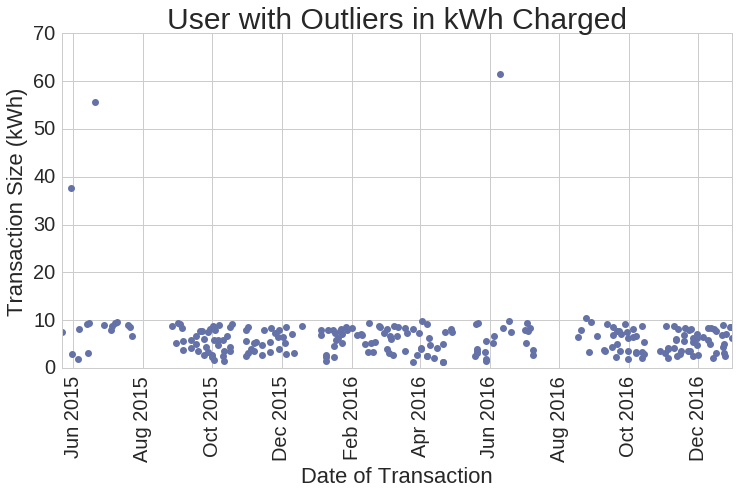

In [167]:
imp.reload(battery_size_functions)

user = 'DEB2E0236B7597068DA087B2EBC8D432C9DF4400A856D3425A9F4859FC5AE52F'
battery_size_functions.plot_user(sessions_data_expanded[user], user,
         save = False, title = "User with Outliers in kWh Charged",
         save_dir = 'data/experiment_figures/battery_size/kwh_changing_users/',
         fig_name = 'outlier_battery_agent')


## Histograms battery categories

/usr/local/lib/python3.4/dist-packages/matplotlib/axes/_axes.py:519: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


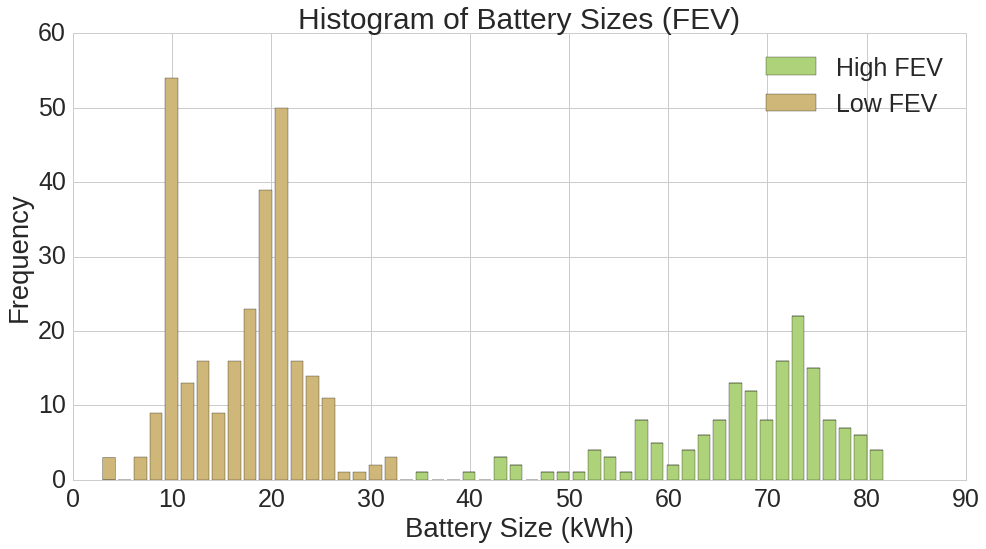

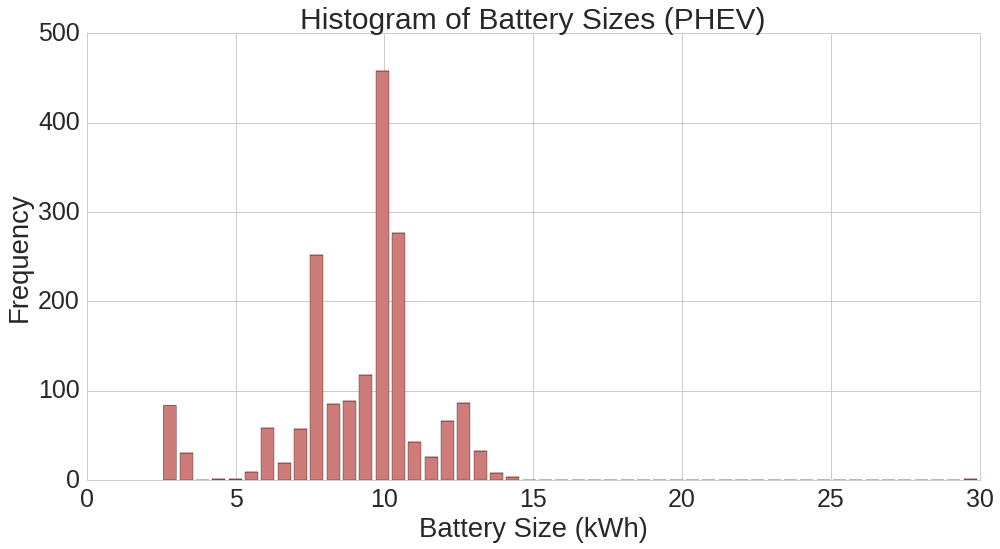

In [58]:
battery_sizes_phev = []
battery_sizes_high = []
battery_sizes_low = []
for i, agent in enumerate(data_agents_20):
    size = data_agents_20[agent]['battery_size']
    if size > 33:
        battery_sizes_high.append(size)
    elif data_agents_20[agent]['car_type'] == 'FEV':
        battery_sizes_low.append(size)
    else:
        battery_sizes_phev.append(size)

seaborn.set(style='whitegrid', font_scale=2.5)
fig = plt.figure(figsize=(16, 8))
plt.hist([battery_sizes_high, battery_sizes_low], bins = 50,
     histtype='barstacked', color= [my_colors['high_light'], my_colors['low_light']], 
    label= ['High FEV', 'Low FEV'], stacked = True)
plt.legend()
plt.title('Histogram of Battery Sizes (FEV)', fontsize = 30)
plt.xlabel('Battery Size (kWh)')
plt.ylabel('Frequency')

seaborn.set(style='whitegrid', font_scale=2.5)
fig = plt.figure(figsize=(16, 8))
plt.hist([battery_sizes_phev, []], bins = 50, 
     histtype='barstacked', color= [my_colors['phev_light'], my_colors['phev_light']])
plt.legend()
plt.title('Histogram of Battery Sizes (PHEV)', fontsize = 30)
plt.xlabel('Battery Size (kWh)')
plt.ylabel('Frequency')

## Distances Shifting vs Hellinger


In [269]:
def get_fractions_shifting_vs_hellinger(bin_size, data_agents):
    dc_dists_agents = {}
    for ID in data_agents:
        dc_dists_agents[ID] = battery_size_functions.sum_distributions(data_agents[ID]['disconnection_duration_dists'])
    max_length = int(60 * 24 / bin_size)
    xvals = [i * bin_size / 60 / 24 for i in range(max_length)]
    dists = []
    for i, ID in enumerate(dc_dists_agents):
        dist = list(dc_dists_agents[ID])
        while (len(dist) < max_length):
            dist.append(0.0)
        dist = dist[:max_length]
        normed_dist = battery_size_functions.convert_to_normed_list(dist, max_length)
        if normed_dist != None:
            dists.append(normed_dist)
    fractions = []
    for i in range(len(dists)):
        for j in numpy.arange(i+1, len(dists)):
            hd = battery_size_functions.get_hellinger_distance(dists[i], dists[j])
            sd = battery_size_functions.get_shifting_distance(dists[i], dists[j])
            fractions.append(sd / hd)
    return fractions, dists
    
def plot_fractions_shifting_vs_hellinger(fractions, title = ' '):
    seaborn.set(style='whitegrid', font_scale=2.5)
    fig = plt.figure(figsize=(12, 6))
    plt.hist(fractions, bins = 30, color = my_colors['main_light'])
    plt.title(title, fontsize = 30)
    plt.xlabel('Fraction')
    plt.ylabel('Frequency')

def plot_users_difference_distances(dists, bin_size, p2, p98):
    max_length = int(60 * 24 / bin_size)
    xvals = [i * bin_size / 60 / 24 for i in range(max_length)]
    plot_counter = 0
    for i in range(len(dists)):
        for j in numpy.arange(i+1, len(dists)):
            hd = battery_size_functions.get_hellinger_distance(dists[i], dists[j])
            sd = battery_size_functions.get_shifting_distance(dists[i], dists[j])
            if sd / hd > p98 or sd / hd < p2:
                if sd / hd > p98:
                    title = ('Distributions with Hellinger Distance Relatively\nLower than Shifting Distance')
                else:
                    title = ('Distributions with Shifting Distance Relatively\nLower than Hellinger Distance')

                simple_plot_mult_dist(xvals, [dists[i], dists[j]], 
                    ['Distribution 1', 'Distribution 2'], xmax = 1, linewidth = 4, title = title, xlabel = 'Disconnection Duration (days)',
                    colors = ['main', 'main_light'])
                plot_counter +=1


                if plot_counter > 19:
                    break
        if plot_counter > 19:
            break
    

In [96]:
%time fracs_20, dists_20 = get_fractions_shifting_vs_hellinger(20, data_agents_20)

sum of zero in convert_to_normed_list
sum of zero in convert_to_normed_list
CPU times: user 11min 45s, sys: 740 ms, total: 11min 46s
Wall time: 11min 46s


In [97]:
%time fracs_60, dists_60 = get_fractions_shifting_vs_hellinger(60, data_agents_60)

sum of zero in convert_to_normed_list
CPU times: user 4min 11s, sys: 536 ms, total: 4min 11s
Wall time: 4min 11s


In [98]:
%time fracs_120, dists_120 = get_fractions_shifting_vs_hellinger(120, data_agents_120)

sum of zero in convert_to_normed_list
sum of zero in convert_to_normed_list
CPU times: user 2min 26s, sys: 400 ms, total: 2min 26s
Wall time: 2min 26s


In [99]:
fracs_20 = [val for val in fracs_20 if not math.isnan(val)]
fracs_60 = [val for val in fracs_60 if not math.isnan(val)]
fracs_120 = [val for val in fracs_120 if not math.isnan(val)]
p98_20 = numpy.percentile(fracs_20, 98)
p2_20 = numpy.percentile(fracs_20, 2)
p98_60 = numpy.percentile(fracs_60, 98)
p2_60 = numpy.percentile(fracs_60, 2)
p98_120 = numpy.percentile(fracs_120, 98)
p2_120 = numpy.percentile(fracs_120, 2)

In [171]:
data_dir = 'data/battery_size/thesis_figures_data/'
with open(data_dir + 'fracs_20.pkl', 'wb') as f:
    pickle.dump(fracs_20, f)
with open(data_dir + 'fracs_20.pkl', 'wb') as f:
    pickle.dump(fracs_60, f)
with open(data_dir + 'fracs_60.pkl', 'wb') as f:
    pickle.dump(fracs_120, f)
with open(data_dir + 'fracs_120.pkl', 'wb') as f:
    pickle.dump(dists_20, f)
with open(data_dir + 'dists_20.pkl', 'wb') as f:
    pickle.dump(dists_60, f)
with open(data_dir + 'dists_60.pkl', 'wb') as f:
    pickle.dump(dists_120, f)
with open(data_dir + 'dists_120.pkl', 'wb') as f:
    pickle.dump(dists_120, f)

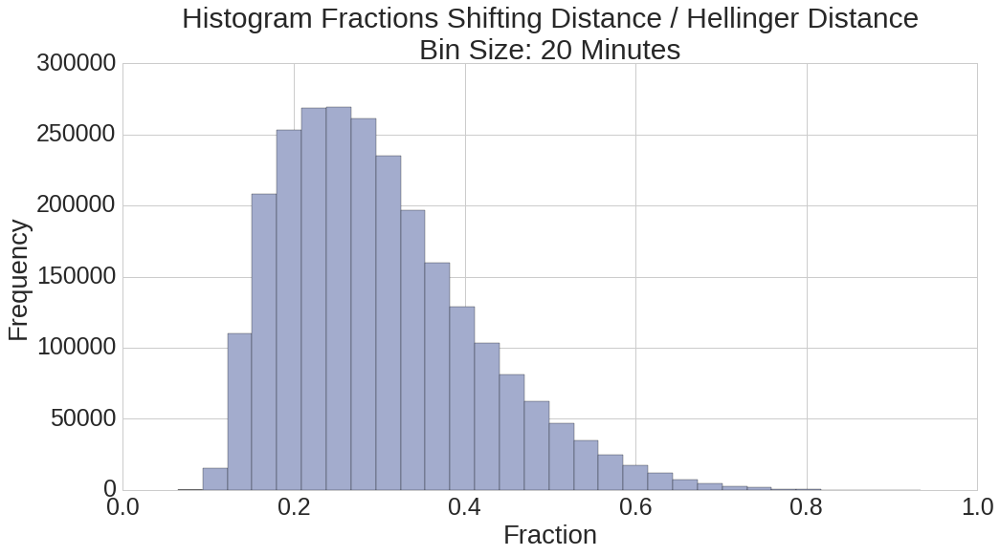

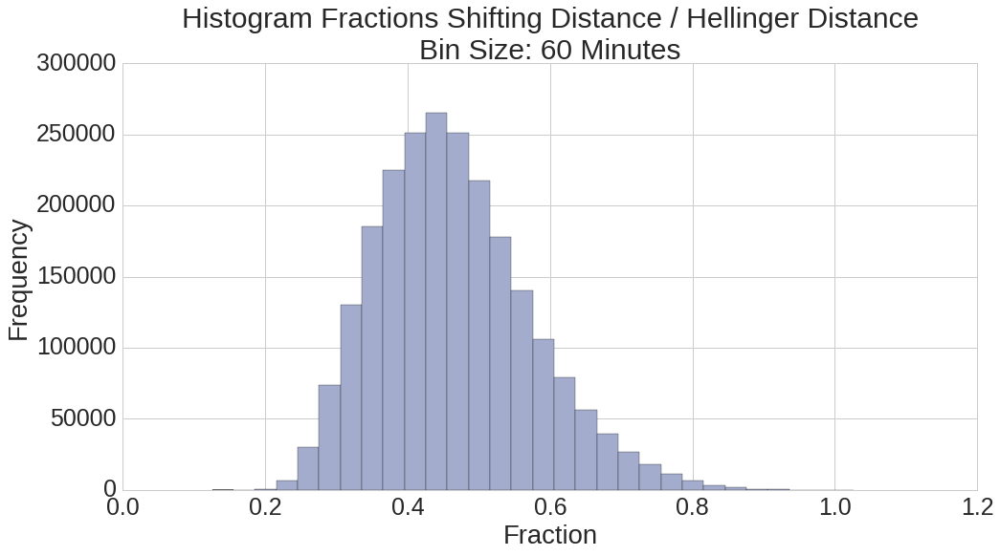

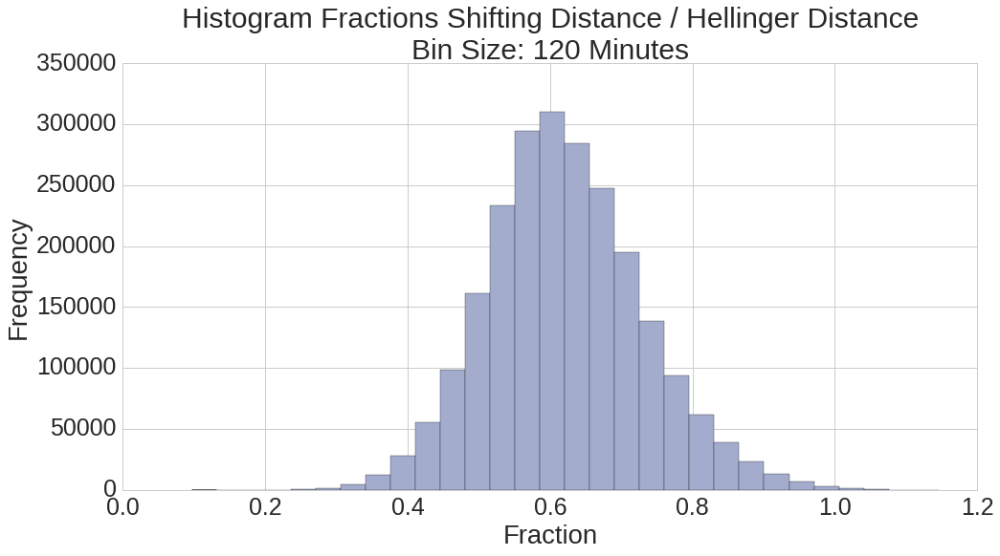

In [91]:
plot_fractions_shifting_vs_hellinger(fracs_20, title = 'Histogram Fractions Shifting Distance / Hellinger Distance\nBin Size: 20 Minutes')
plot_fractions_shifting_vs_hellinger(fracs_60, title = 'Histogram Fractions Shifting Distance / Hellinger Distance\nBin Size: 60 Minutes')
plot_fractions_shifting_vs_hellinger(fracs_120, title = 'Histogram Fractions Shifting Distance / Hellinger Distance\nBin Size: 120 Minutes')

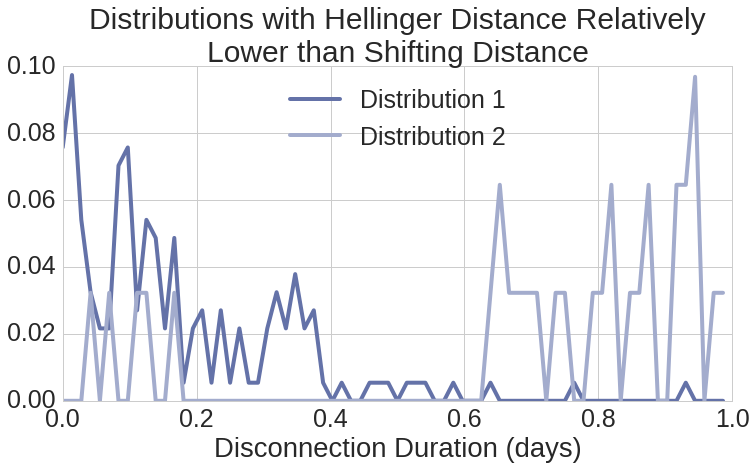

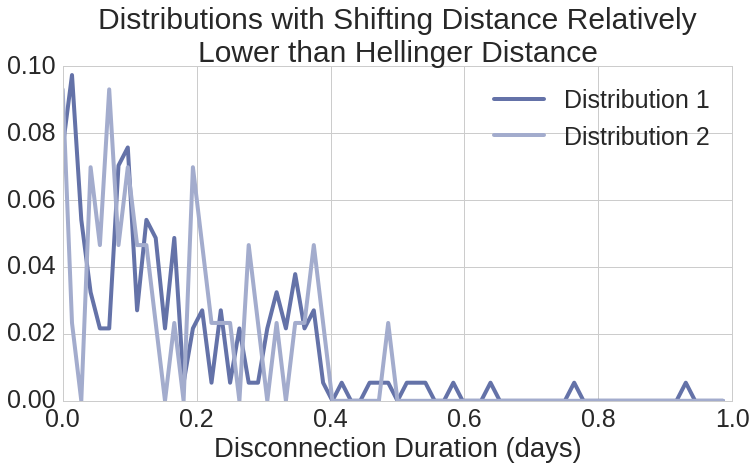

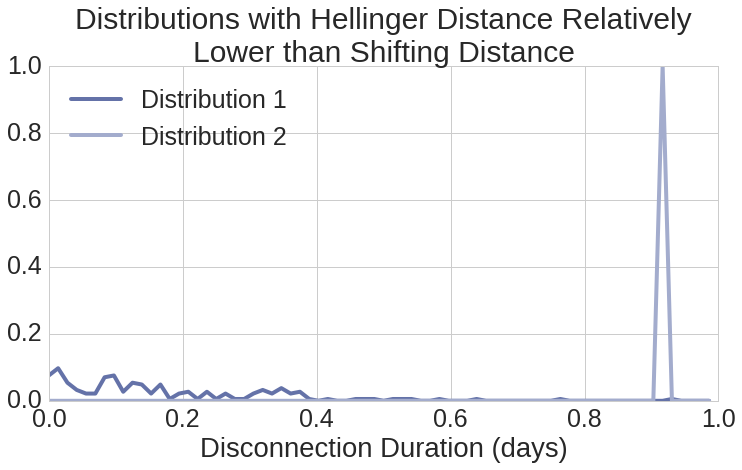

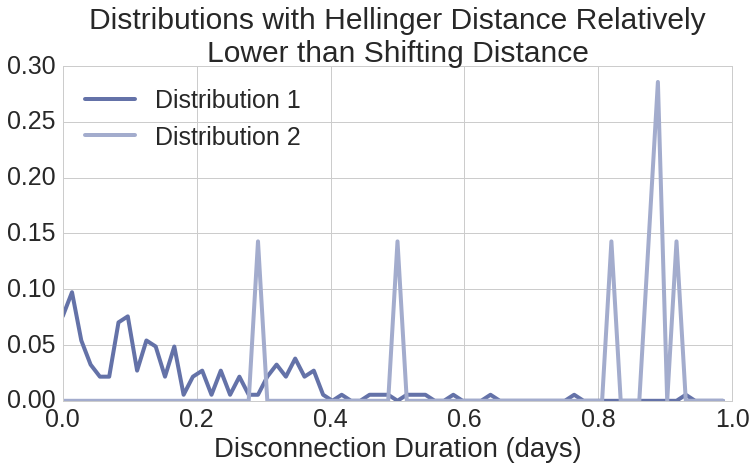

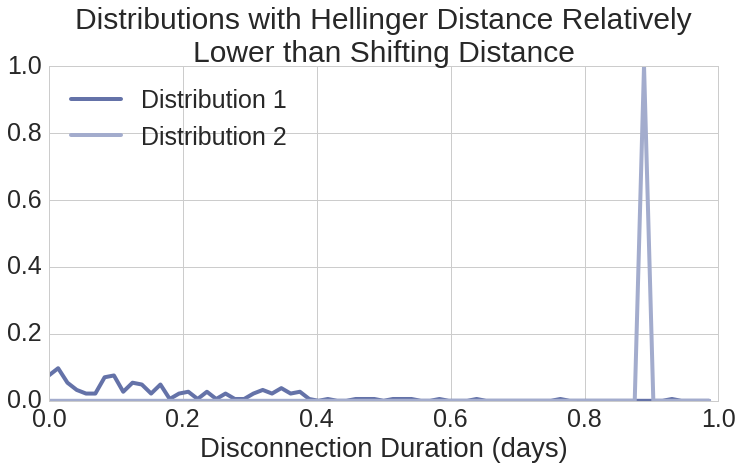

...

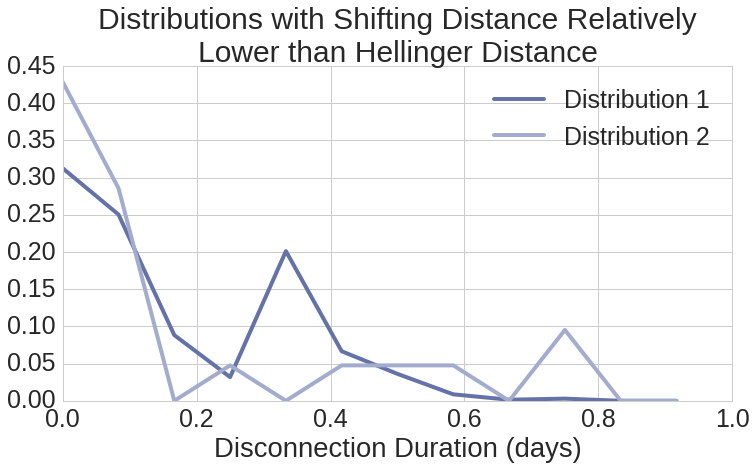

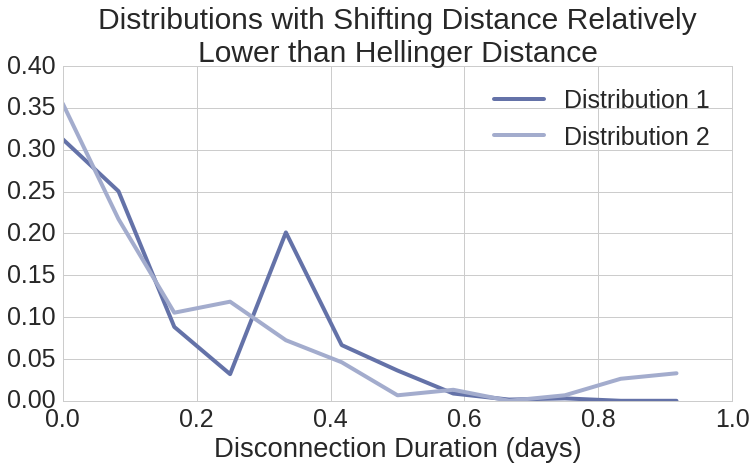

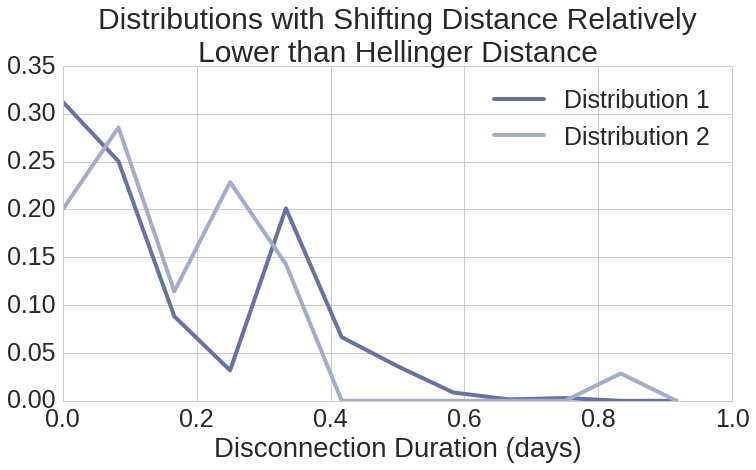

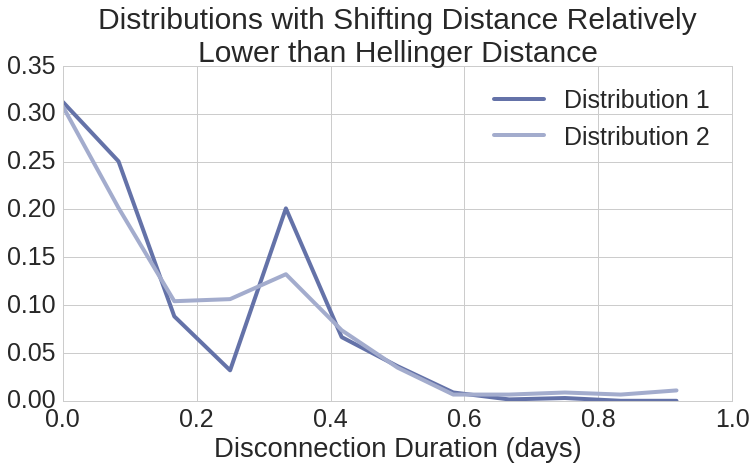

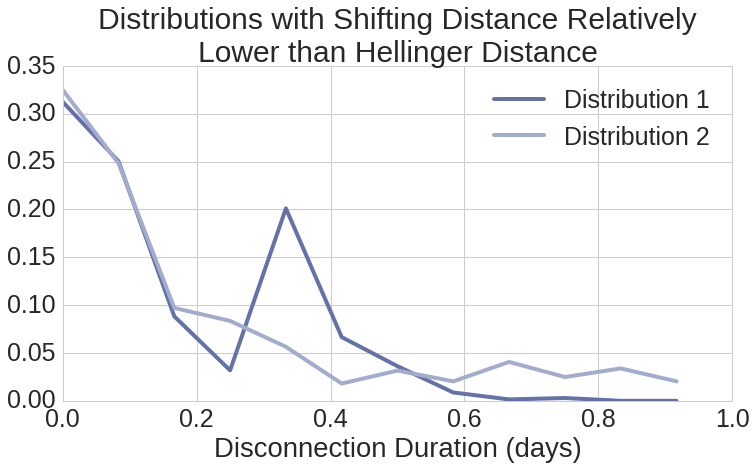

In [270]:
plot_users_difference_distances(dists_20, 20, p2_20, p98_20)
plot_users_difference_distances(dists_60, 60, p2_60, p98_60)
plot_users_difference_distances(dists_120, 120, p2_120, p98_120)

## 4 vars differences categories

In [265]:
def plot_pointplot(df, xname, yname, ylabel = " ", title = " "):
    seaborn.set(style='whitegrid', font_scale=2.5)
    fig = plt.figure(figsize=(12,6))
    colors = [my_colors['phev'], my_colors['low'], my_colors['high']]
    ax = seaborn.pointplot(x = xname, y = yname, order = ['phev', 'fev_low', 'fev_high'], 
                           palette = colors, data = df, join = False, capsize = 0.2, scale=2)   

    plt.title(title, fontsize = 30)
    plt.xlabel(" ")
    plt.ylabel(ylabel)
    ax.set(xticklabels=['PHEV', "Low FEV", "High FEV"])
    plt.show()

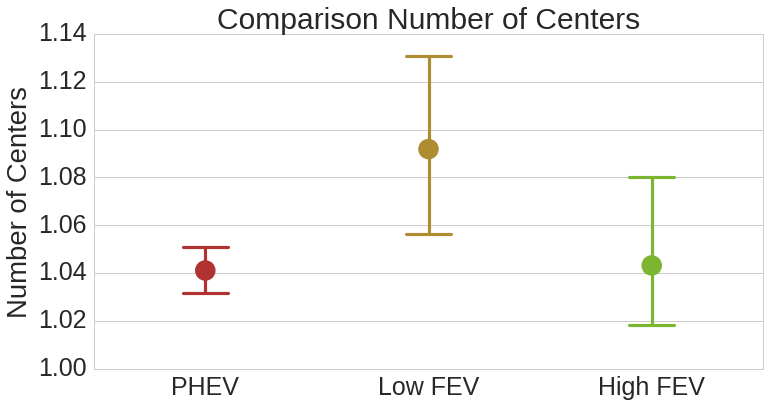

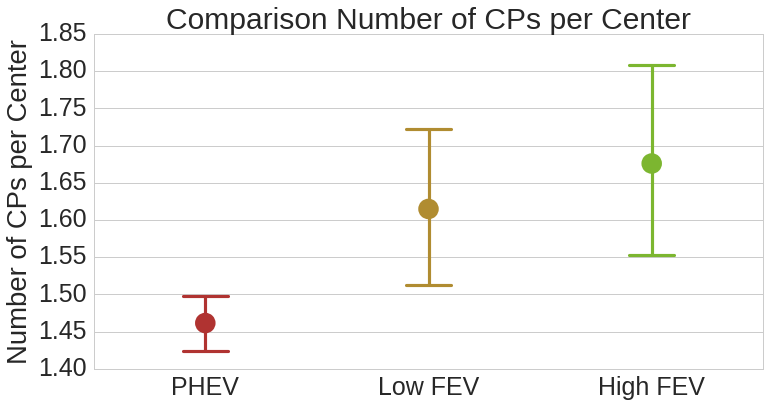

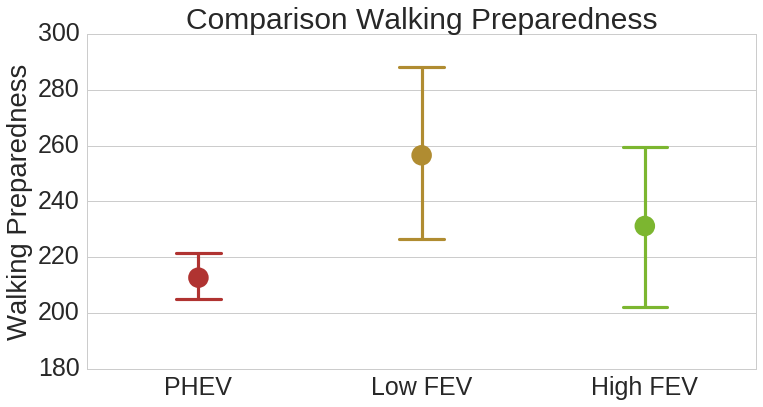

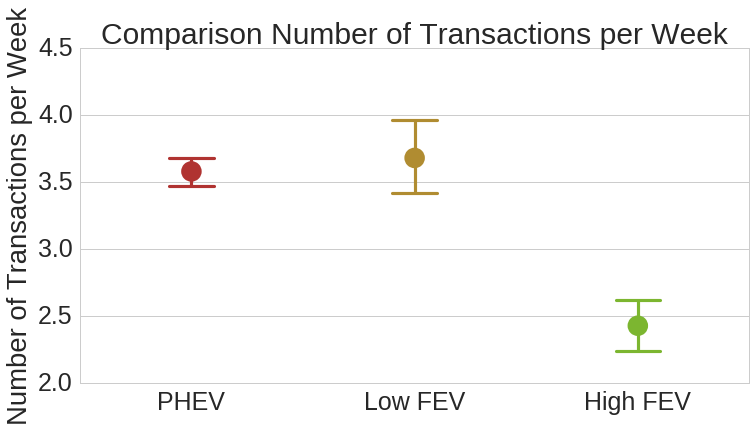

In [266]:
plot_pointplot(data_agents_df_20[data_agents_df_20.battery_category != "unknown"], 
               'battery_category', 'nr_centers', ylabel = "Number of Centers",
              title = 'Comparison Number of Centers')
plot_pointplot(data_agents_df_20[data_agents_df_20.battery_category != "unknown"], 
               'battery_category', 'nr_css_per_center', ylabel = "Number of CPs per Center",
              title = 'Comparison Number of CPs per Center')
plot_pointplot(data_agents_df_20[data_agents_df_20.battery_category != "unknown"], 
               'battery_category', 'walking_preparedness', ylabel = "Walking Preparedness",
              title = 'Comparison Walking Preparedness')
plot_pointplot(data_agents_df_20[data_agents_df_20.battery_category != "unknown"], 
               'battery_category', 'nr_sessions_per_week', ylabel = "Number of Transactions per Week",
              title = 'Comparison Number of Transactions per Week')

## Scopes

In [178]:
all_disconnection_distributions_phev = [data_agents_20[agent]['overall_disconnection_distribution'] 
    for agent in data_agents if data_agents_20[agent]['battery_category'] == 'phev']
all_disconnection_distributions_low_fev = [data_agents_20[agent]['overall_disconnection_distribution'] 
    for agent in data_agents if data_agents_20[agent]['battery_category'] == 'fev_low']
all_disconnection_distributions_high_fev = [data_agents_20[agent]['overall_disconnection_distribution'] 
    for agent in data_agents if data_agents_20[agent]['battery_category'] == 'fev_high']

phev_disconnection_dist = battery_size_functions.sum_distributions(all_disconnection_distributions_phev)
low_fev_disconnection_dist = battery_size_functions.sum_distributions(all_disconnection_distributions_low_fev)
high_fev_disconnection_dist = battery_size_functions.sum_distributions(all_disconnection_distributions_high_fev)

all_connection_distributions_phev = [data_agents[agent]['overall_connection_distribution'][center] 
    for agent in data_agents for center in data_agents[agent]['overall_connection_distribution'] 
                                     if data_agents[agent]['battery_category'] == 'phev']
all_connection_distributions_low_fev = [data_agents[agent]['overall_connection_distribution'][center] 
    for agent in data_agents for center in data_agents[agent]['overall_connection_distribution']
                                        if data_agents[agent]['battery_category'] == 'fev_low']
all_connection_distributions_high_fev = [data_agents[agent]['overall_connection_distribution'][center] 
    for agent in data_agents for center in data_agents[agent]['overall_connection_distribution'] 
                                         if data_agents[agent]['battery_category'] == 'fev_high']

phev_connection_dist = battery_size_functions.sum_distributions(all_connection_distributions_phev)
low_fev_connection_dist = battery_size_functions.sum_distributions(all_connection_distributions_low_fev)
high_fev_connection_dist = battery_size_functions.sum_distributions(all_connection_distributions_high_fev)

normed_phev_disconnection_dist = phev_disconnection_dist / numpy.sum(phev_disconnection_dist)
normed_low_fev_disconnection_dist = low_fev_disconnection_dist / numpy.sum(low_fev_disconnection_dist)
normed_high_fev_disconnection_dist = high_fev_disconnection_dist / numpy.sum(high_fev_disconnection_dist)

normed_phev_connection_dist = phev_connection_dist / numpy.sum(phev_connection_dist)
normed_low_fev_connection_dist = low_fev_connection_dist / numpy.sum(low_fev_connection_dist)
normed_high_fev_connection_dist = high_fev_connection_dist / numpy.sum(high_fev_connection_dist)

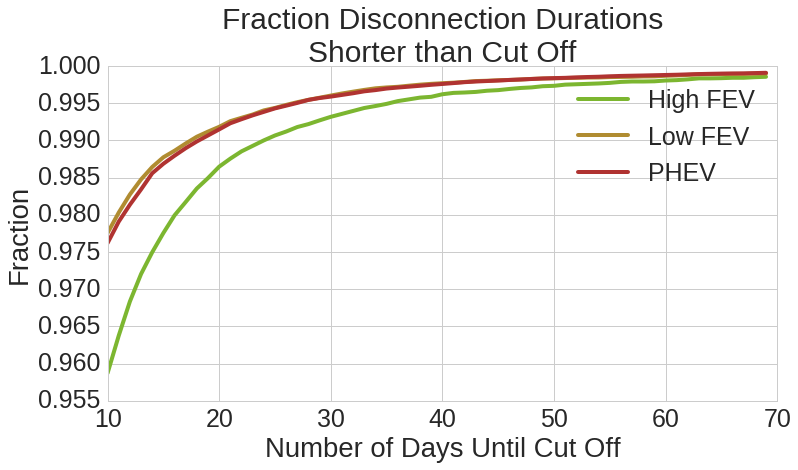

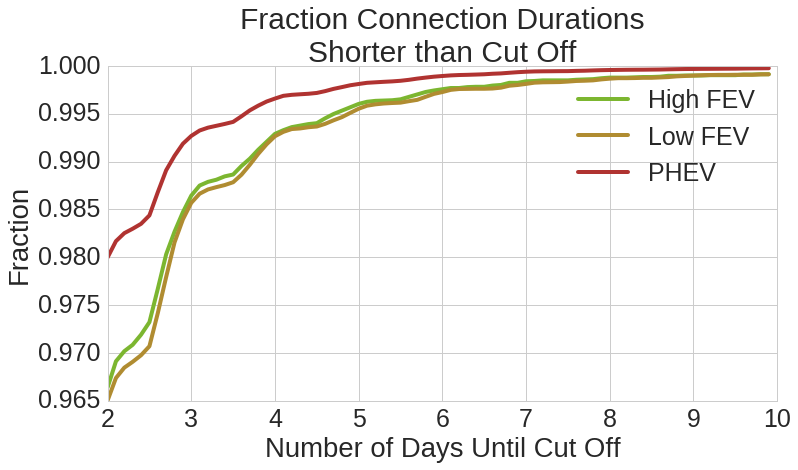

In [188]:
dc_bins = int(40 * 24 * 60 / 20)
dc_days = dc_bins * 20 / 60 / 24

con_bins = int(5 * 24 * 60 / 20)
con_days = con_bins * 20 / 60 / 24

def plot_frac_trans_vs_length_dist(start_days, end_days, high_dist, low_dist, phev_dist, title = " ", step_size = 1.0):
    high_sums = []
    phev_sums = []
    low_sums = []
    bin_range = numpy.arange(start_days * 72, end_days * 72, step_size * 72)
    for nr_bins in bin_range:
        nr_bins = int(nr_bins)
        high_sums.append(sum(high_dist[:nr_bins]))
        low_sums.append(sum(low_dist[:nr_bins]))
        phev_sums.append(sum(phev_dist[:nr_bins]))
    seaborn.set(style='whitegrid', font_scale=2.5)
    plt.figure(figsize=(12, 6))
    ylabels = ['High FEV', 'Low FEV', 'PHEV']
    colors = [my_colors['high'], my_colors['low'], my_colors['phev']]
    labels = []
    yvals = [high_sums, low_sums, phev_sums]
    for i, yval in enumerate(yvals):
        lab, = plt.plot([b /72 for b in bin_range], yval, label = ylabels[i], linewidth=4, color = colors[i])
        labels.append(lab)
    plt.legend(handles=labels)
    plt.xlabel('Number of Days Until Cut Off')
    plt.ylabel('Fraction')
    plt.title(title, fontsize = 30)
    plt.show()
    
plot_frac_trans_vs_length_dist(10, 70, normed_high_fev_disconnection_dist, normed_low_fev_disconnection_dist, 
                               normed_phev_disconnection_dist, title = 'Fraction Disconnection Durations\nShorter than Cut Off')
# plot_frac_trans_vs_length_dist(2, 15, normed_high_fev_disconnection_dist, normed_low_fev_disconnection_dist, 
#                                normed_phev_disconnection_dist, title = 'Disconnection')

plot_frac_trans_vs_length_dist(2, 10, normed_high_fev_connection_dist, normed_low_fev_connection_dist, 
                               normed_phev_connection_dist, title = 'Fraction Connection Durations\nShorter than Cut Off', step_size = 0.1)
# plot_frac_trans_vs_length_dist(0, 3, normed_high_fev_connection_dist, normed_low_fev_connection_dist, 
#                                normed_phev_connection_dist, title = 'Connection', step_size = 0.1)





## Distributions

In [484]:
print(sum(disconnection_distribution_phev_20[:72]), sum(disconnection_distribution_phev_20[72:]))
print(sum(disconnection_distribution_high_fev_20[:72]), sum(disconnection_distribution_high_fev_20[72:]))
print(sum(disconnection_distribution_low_fev_20[:72]), sum(disconnection_distribution_low_fev_20[72:]))




0.698262809433 0.301738778469
0.514295287853 0.485731321372
0.703474945862 0.296545209957


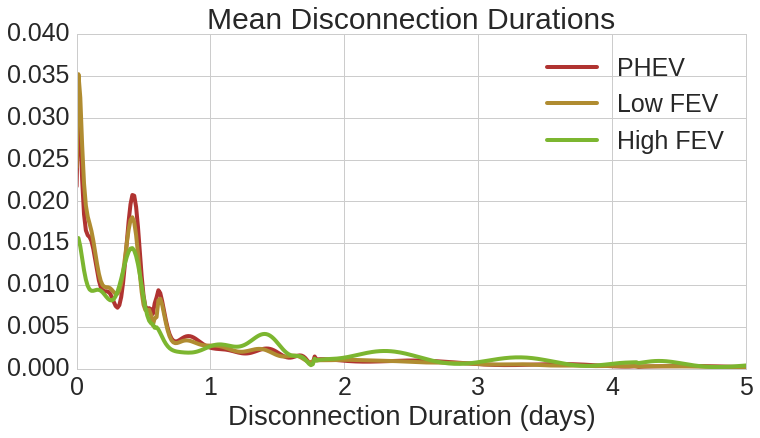

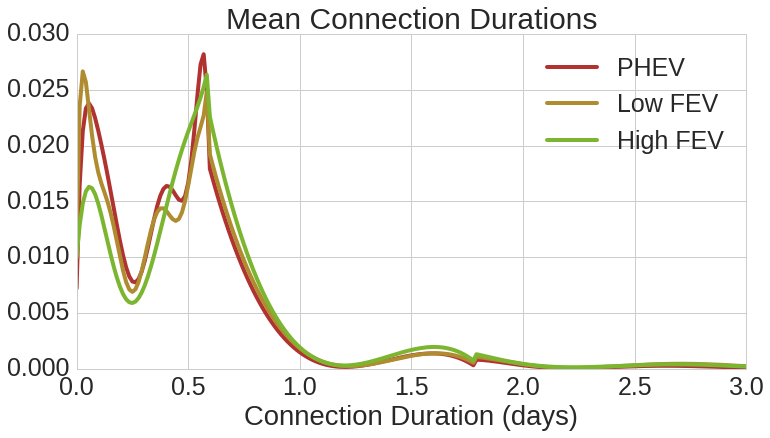

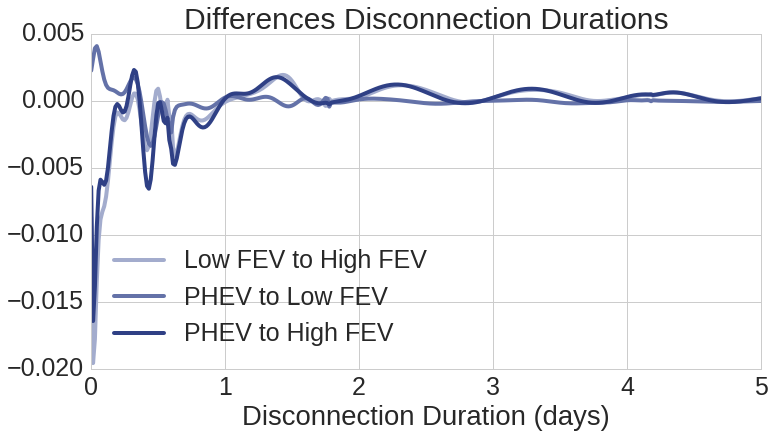

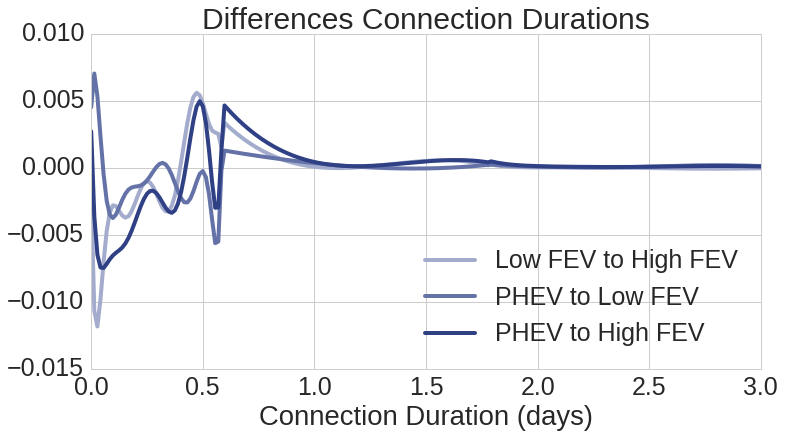

In [264]:
bin_size = 20
dc_xvals = [i * bin_size / 60 / 24 for i in range(max_dc_20)]
con_xvals = [i * bin_size / 60 / 24 for i in range(max_con_20)]
dc_yvals = [disconnection_distribution_phev_20[:max_dc_20], disconnection_distribution_low_fev_20[:max_dc_20],
           disconnection_distribution_high_fev_20[:max_dc_20]]
dc_ylabs = ['PHEV', 'Low FEV', 'High FEV']
con_yvals = [connection_distribution_phev_20[:max_con_20], connection_distribution_low_fev_20[:max_con_20],
            connection_distribution_high_fev_20[:max_con_20]]
con_ylabs = ['PHEV', 'Low FEV', 'High FEV']
simple_plot_mult_dist(dc_xvals, dc_yvals, dc_ylabs, title = 'Mean Disconnection Durations', 
    xmax = 5, colors = ['phev', 'low', 'high'], xlabel = 'Disconnection Duration (days)', 
    ylabel = '')
simple_plot_mult_dist(con_xvals, con_yvals, con_ylabs, title = 'Mean Connection Durations', 
    xmax = 3, colors = ['phev', 'low', 'high'], xlabel = 'Connection Duration (days)', 
     ylabel = '')

diff_dc_phev_to_high = [disconnection_distribution_high_fev_20[i] - disconnection_distribution_phev_20[i] for i in range(max_dc_20)]
diff_dc_phev_to_low = [disconnection_distribution_low_fev_20[i] - disconnection_distribution_phev_20[i] for i in range(max_dc_20)]
diff_dc_low_to_high = [disconnection_distribution_high_fev_20[i] - disconnection_distribution_low_fev_20[i] for i in range(max_dc_20)]

diff_con_phev_to_high = [connection_distribution_high_fev_20[i] - connection_distribution_phev_20[i] for i in range(max_con_20)]
diff_con_phev_to_low = [connection_distribution_low_fev_20[i] - connection_distribution_phev_20[i] for i in range(max_con_20)]
diff_con_low_to_high = [connection_distribution_high_fev_20[i] - connection_distribution_low_fev_20[i] for i in range(max_con_20)]


simple_plot_mult_dist(dc_xvals, [diff_dc_low_to_high[:max_dc_20], diff_dc_phev_to_low[:max_dc_20], 
    diff_dc_phev_to_high[:max_dc_20]], 
    yvals_labels = ['Low FEV to High FEV', 'PHEV to Low FEV', 'PHEV to High FEV'], 
    title = 'Differences Disconnection Durations', xmin = 0, xmax = 5,
    colors = ['main_light', 'main', 'main_dark'], xlabel = 'Disconnection Duration (days)', 
     ylabel = '')
simple_plot_mult_dist(con_xvals, [diff_con_low_to_high[:max_con_20], diff_con_phev_to_low[:max_con_20], 
    diff_con_phev_to_high[:max_con_20]], 
    yvals_labels = ['Low FEV to High FEV', 'PHEV to Low FEV', 'PHEV to High FEV'], 
    title = 'Differences Connection Durations', xmin = 0, xmax = 3,
    colors = ['main_light', 'main', 'main_dark'], xlabel = 'Connection Duration (days)', 
    ylabel = '')


In [257]:
home_connection_distributions_phev = [data_agents[agent]['overall_connection_distribution'][center] 
    for agent in data_agents for center in data_agents[agent]['overall_connection_distribution'] 
        if data_agents[agent]['battery_category'] == 'phev' and 
            data_agents[agent]['centers_info'][center]['center_type_training'] == 'home']
home_connection_distributions_low_fev = [data_agents[agent]['overall_connection_distribution'][center] 
    for agent in data_agents for center in data_agents[agent]['overall_connection_distribution']
        if data_agents[agent]['battery_category'] == 'fev_low' and  
            data_agents[agent]['centers_info'][center]['center_type_training'] == 'home']
home_connection_distributions_high_fev = [data_agents[agent]['overall_connection_distribution'][center] 
    for agent in data_agents for center in data_agents[agent]['overall_connection_distribution'] 
            if data_agents[agent]['battery_category'] == 'fev_high' and  
            data_agents[agent]['centers_info'][center]['center_type_training'] == 'home']

phev_home_connection_dist = battery_size_functions.sum_distributions(home_connection_distributions_phev)
low_fev_home_connection_dist = battery_size_functions.sum_distributions(home_connection_distributions_low_fev)
high_fev_home_connection_dist = battery_size_functions.sum_distributions(home_connection_distributions_high_fev)

phev_home_connection_dist = phev_home_connection_dist[:max_con_20] / sum(phev_home_connection_dist[:max_con_20])
low_fev_home_connection_dist = low_fev_home_connection_dist[:max_con_20] / sum(low_fev_home_connection_dist[:max_con_20])
high_fev_home_connection_dist = high_fev_home_connection_dist[:max_con_20] / sum(high_fev_home_connection_dist[:max_con_20])

not_home_connection_distributions_phev = [data_agents[agent]['overall_connection_distribution'][center] 
    for agent in data_agents for center in data_agents[agent]['overall_connection_distribution'] 
        if data_agents[agent]['battery_category'] == 'phev' and 
            data_agents[agent]['centers_info'][center]['center_type_training'] == 'not_home']
not_home_connection_distributions_low_fev = [data_agents[agent]['overall_connection_distribution'][center] 
    for agent in data_agents for center in data_agents[agent]['overall_connection_distribution']
        if data_agents[agent]['battery_category'] == 'fev_low' and  
            data_agents[agent]['centers_info'][center]['center_type_training'] == 'not_home']
not_home_connection_distributions_high_fev = [data_agents[agent]['overall_connection_distribution'][center] 
    for agent in data_agents for center in data_agents[agent]['overall_connection_distribution'] 
            if data_agents[agent]['battery_category'] == 'fev_high' and  
            data_agents[agent]['centers_info'][center]['center_type_training'] == 'not_home']

phev_not_home_connection_dist = battery_size_functions.sum_distributions(not_home_connection_distributions_phev)
low_fev_not_home_connection_dist = battery_size_functions.sum_distributions(not_home_connection_distributions_low_fev)
high_fev_not_home_connection_dist = battery_size_functions.sum_distributions(not_home_connection_distributions_high_fev)

phev_not_home_connection_dist = phev_not_home_connection_dist[:max_con_20] / sum(phev_not_home_connection_dist[:max_con_20])
low_fev_not_home_connection_dist = low_fev_not_home_connection_dist[:max_con_20] / sum(low_fev_not_home_connection_dist[:max_con_20])
high_fev_not_home_connection_dist = battery_size_functions.convert_to_normed_list(high_fev_not_home_connection_dist, max_con_20, fill_with = 0.0)

phev_home_connection_dist = battery_size_functions.get_high_range_fit_dist(0, max_con_20, 
                                phev_home_connection_dist, plot_full_fit = False)
low_fev_home_connection_dist = battery_size_functions.get_high_range_fit_dist(0, max_con_20, 
                                low_fev_home_connection_dist, plot_full_fit = False)
high_fev_home_connection_dist = battery_size_functions.get_high_range_fit_dist(0, max_con_20, 
                                high_fev_home_connection_dist, plot_full_fit = False)
phev_not_home_connection_dist = battery_size_functions.get_high_range_fit_dist(0, max_con_20, 
                                phev_not_home_connection_dist, plot_full_fit = False)
low_fev_not_home_connection_dist = battery_size_functions.get_high_range_fit_dist(0, max_con_20, 
                                low_fev_not_home_connection_dist, plot_full_fit = False)
high_fev_not_home_connection_dist = battery_size_functions.get_high_range_fit_dist(0, max_con_20, 
                                high_fev_not_home_connection_dist, plot_full_fit = False)

phev_home_connection_dist = battery_size_functions.no_negatives(phev_home_connection_dist)
low_fev_home_connection_dist = battery_size_functions.no_negatives(low_fev_home_connection_dist)
high_fev_home_connection_dist = battery_size_functions.no_negatives(high_fev_home_connection_dist)
phev_not_home_connection_dist = battery_size_functions.no_negatives(phev_not_home_connection_dist)
low_fev_not_home_connection_dist = battery_size_functions.no_negatives(low_fev_not_home_connection_dist)
high_fev_not_home_connection_dist = battery_size_functions.no_negatives(high_fev_not_home_connection_dist)

phev_home_connection_dist = battery_size_functions.convert_to_normed_list(phev_home_connection_dist, max_con_20, fill_with = 0.0)
low_fev_home_connection_dist = battery_size_functions.convert_to_normed_list(low_fev_home_connection_dist, max_con_20, fill_with = 0.0)
high_fev_home_connection_dist = battery_size_functions.convert_to_normed_list(high_fev_home_connection_dist, max_con_20, fill_with = 0.0)
phev_not_home_connection_dist = battery_size_functions.convert_to_normed_list(phev_not_home_connection_dist, max_con_20, fill_with = 0.0)
low_fev_not_home_connection_dist = battery_size_functions.convert_to_normed_list(low_fev_not_home_connection_dist, max_con_20, fill_with = 0.0)
high_fev_not_home_connection_dist = battery_size_functions.convert_to_normed_list(high_fev_not_home_connection_dist, max_con_20, fill_with = 0.0)



/usr/local/lib/python3.4/dist-packages/numpy/lib/polynomial.py:594: RankWarning: Polyfit may be poorly conditioned
  warnings.warn(msg, RankWarning)
/usr/local/lib/python3.4/dist-packages/numpy/lib/polynomial.py:594: RankWarning: Polyfit may be poorly conditioned
  warnings.warn(msg, RankWarning)
/usr/local/lib/python3.4/dist-packages/numpy/lib/polynomial.py:594: RankWarning: Polyfit may be poorly conditioned
  warnings.warn(msg, RankWarning)
/usr/local/lib/python3.4/dist-packages/numpy/lib/polynomial.py:594: RankWarning: Polyfit may be poorly conditioned
  warnings.warn(msg, RankWarning)
/usr/local/lib/python3.4/dist-packages/numpy/lib/polynomial.py:594: RankWarning: Polyfit may be poorly conditioned
  warnings.warn(msg, RankWarning)
/usr/local/lib/python3.4/dist-packages/numpy/lib/polynomial.py:594: RankWarning: Polyfit may be poorly conditioned
  warnings.warn(msg, RankWarning)
/usr/local/lib/python3.4/dist-packages/numpy/lib/polynomial.py:594: RankWarning: Polyfit may be poorly con

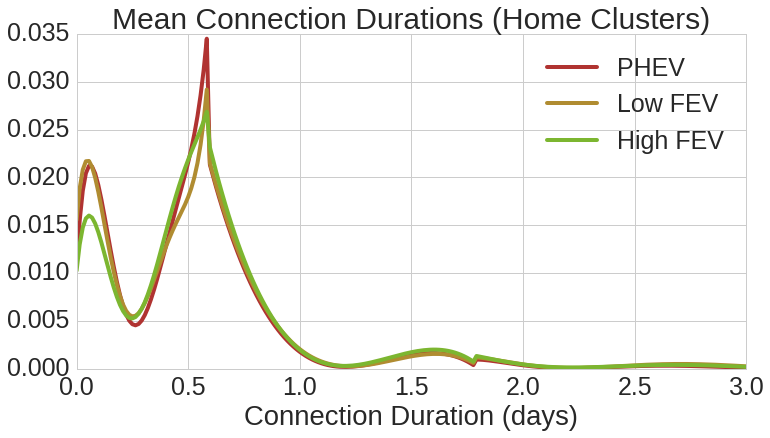

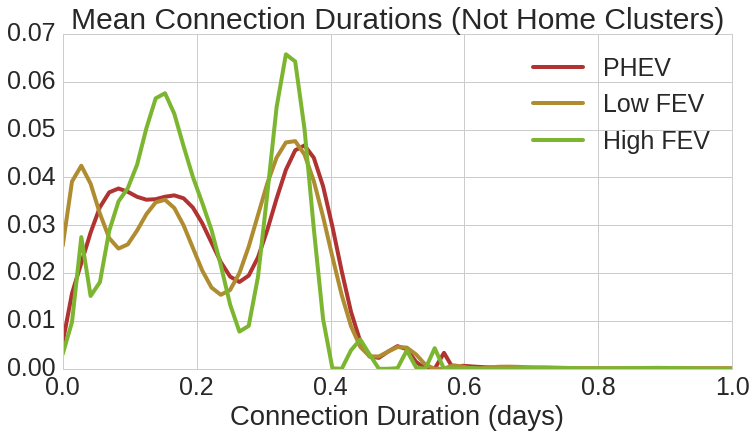

In [263]:
bin_size = 20
con_xvals = [i * bin_size / 60 / 24 for i in range(max_con_20)]
con_yvals = [phev_home_connection_dist[:max_con_20], low_fev_home_connection_dist[:max_con_20],
            high_fev_home_connection_dist[:max_con_20]]
con_ylabs = ['PHEV', 'Low FEV', 'High FEV']
simple_plot_mult_dist(con_xvals, con_yvals, con_ylabs, title = 'Mean Connection Durations (Home Clusters)', 
    xmax = 3, colors = ['phev', 'low', 'high'], xlabel = 'Connection Duration (days)', 
     ylabel = '')
con_yvals = [phev_not_home_connection_dist[:max_con_20], low_fev_not_home_connection_dist[:max_con_20],
            high_fev_not_home_connection_dist[:max_con_20]]
simple_plot_mult_dist(con_xvals, con_yvals, con_ylabs, title = 'Mean Connection Durations (Not Home Clusters)', 
    xmax = 1, colors = ['phev', 'low', 'high'], xlabel = 'Connection Duration (days)', 
     ylabel = '')

In [259]:
print('Disconnection')
battery_size_functions.print_errors(disconnection_distribution_high_fev_20, disconnection_distribution_phev_20,
                                   ['high fev', 'phev'], max_size = max_dc_20)
battery_size_functions.print_errors(disconnection_distribution_low_fev_20, disconnection_distribution_high_fev_20,
                                   ['low fev', 'high fev'], max_size = max_dc_20)
battery_size_functions.print_errors(disconnection_distribution_low_fev_20, disconnection_distribution_phev_20,
                                   ['low fev', 'phev'], max_size = max_dc_20)

print('\nConnection')
battery_size_functions.print_errors(connection_distribution_high_fev_20, connection_distribution_phev_20,
                                   ['high fev', 'phev'], max_size = max_con_20)
battery_size_functions.print_errors(connection_distribution_low_fev_20, connection_distribution_high_fev_20,
                                   ['low fev', 'high fev'], max_size = max_con_20)
battery_size_functions.print_errors(connection_distribution_low_fev_20, connection_distribution_phev_20,
                                   ['low fev', 'phev'], max_size = max_con_20)

print('\nConnection (home)')
battery_size_functions.print_errors(high_fev_home_connection_dist, phev_home_connection_dist,
                                   ['high fev', 'phev'], max_size = max_con_20)
battery_size_functions.print_errors(low_fev_home_connection_dist, high_fev_home_connection_dist,
                                   ['low fev', 'high fev'], max_size = max_con_20)
battery_size_functions.print_errors(low_fev_home_connection_dist, phev_home_connection_dist,
                                   ['low fev', 'phev'], max_size = max_con_20)


print('\nConnection (not home)')
battery_size_functions.print_errors(high_fev_not_home_connection_dist, phev_not_home_connection_dist,
                                   ['high fev', 'phev'], max_size = max_con_20)
battery_size_functions.print_errors(low_fev_not_home_connection_dist, high_fev_not_home_connection_dist,
                                   ['low fev', 'high fev'], max_size = max_con_20)
battery_size_functions.print_errors(low_fev_not_home_connection_dist, phev_not_home_connection_dist,
                                   ['low fev', 'phev'], max_size = max_con_20)



Disconnection
Errors for high fev and phev:
	Hellinger distance: 0.1717
	Shifting distance: 0.0215
Errors for low fev and high fev:
	Hellinger distance: 0.1722
	Shifting distance: 0.0232
Errors for low fev and phev:
	Hellinger distance: 0.0483
	Shifting distance: 0.0018

Connection
Errors for high fev and phev:
	Hellinger distance: 0.1017
	Shifting distance: 0.0252
Errors for low fev and high fev:
	Hellinger distance: 0.0870
	Shifting distance: 0.0144
Errors for low fev and phev:
	Hellinger distance: 0.0638
	Shifting distance: 0.0132

Connection (home)
Errors for high fev and phev:
	Hellinger distance: 0.0646
	Shifting distance: 0.0135
Errors for low fev and high fev:
	Hellinger distance: 0.0620
	Shifting distance: 0.0093
Errors for low fev and phev:
	Hellinger distance: 0.0574
	Shifting distance: 0.0096

Connection (not home)
Errors for high fev and phev:
	Hellinger distance: 0.2362
	Shifting distance: 0.0092
Errors for low fev and high fev:
	Hellinger distance: 0.2551
	Shifting dista

In [271]:
data_agents = data_agents_20

In [275]:
all_activity_patterns_phev = [data_agents[agent]['overall_activity_pattern'] 
    for agent in data_agents if data_agents[agent]['battery_category'] == 'phev']
all_activity_patterns_low_fev = [data_agents[agent]['overall_activity_pattern'] 
    for agent in data_agents if data_agents[agent]['battery_category'] == 'fev_low']
all_activity_patterns_high_fev = [data_agents[agent]['overall_activity_pattern'] 
    for agent in data_agents if data_agents[agent]['battery_category'] == 'fev_high']

phev_activity_patterns = battery_size_functions.sum_distributions(all_activity_patterns_phev)
low_fev_activity_patterns = battery_size_functions.sum_distributions(all_activity_patterns_low_fev)
high_fev_activity_patterns = battery_size_functions.sum_distributions(all_activity_patterns_high_fev)

all_centers_activity_patterns_phev = [data_agents[agent]['activity_patterns_centers'][center] 
    for agent in data_agents for center in data_agents[agent]['activity_patterns_centers'] 
            if data_agents[agent]['battery_category'] == 'phev']
all_centers_activity_patterns_low_fev = [data_agents[agent]['activity_patterns_centers'][center] 
    for agent in data_agents for center in data_agents[agent]['activity_patterns_centers'] 
            if data_agents[agent]['battery_category'] == 'fev_low']
all_centers_activity_patterns_high_fev = [data_agents[agent]['activity_patterns_centers'][center] 
    for agent in data_agents for center in data_agents[agent]['activity_patterns_centers'] 
            if data_agents[agent]['battery_category'] == 'fev_high']

phev_centers_activity_patterns = battery_size_functions.sum_distributions(all_centers_activity_patterns_phev)
low_fev_centers_activity_patterns = battery_size_functions.sum_distributions(all_centers_activity_patterns_low_fev)
high_fev_centers_activity_patterns = battery_size_functions.sum_distributions(all_centers_activity_patterns_high_fev)

home_centers_activity_patterns_phev = [data_agents[agent]['activity_patterns_centers'][center] 
    for agent in data_agents for center in data_agents[agent]['activity_patterns_centers'] 
            if data_agents[agent]['battery_category'] == 'phev' and 
            data_agents[agent]['centers_info'][center]['center_type_training'] == 'home']
home_centers_activity_patterns_low_fev = [data_agents[agent]['activity_patterns_centers'][center] 
    for agent in data_agents for center in data_agents[agent]['activity_patterns_centers'] 
            if data_agents[agent]['battery_category'] == 'fev_low' and 
            data_agents[agent]['centers_info'][center]['center_type_training'] == 'home']
home_centers_activity_patterns_high_fev = [data_agents[agent]['activity_patterns_centers'][center] 
    for agent in data_agents for center in data_agents[agent]['activity_patterns_centers'] 
            if data_agents[agent]['battery_category'] == 'fev_high' and 
            data_agents[agent]['centers_info'][center]['center_type_training'] == 'home']

phev_home_centers_activity_patterns = battery_size_functions.sum_distributions(home_centers_activity_patterns_phev)
low_fev_home_centers_activity_patterns = battery_size_functions.sum_distributions(home_centers_activity_patterns_low_fev)
high_fev_home_centers_activity_patterns = battery_size_functions.sum_distributions(home_centers_activity_patterns_high_fev)


not_home_centers_activity_patterns_phev = [data_agents[agent]['activity_patterns_centers'][center] 
    for agent in data_agents for center in data_agents[agent]['activity_patterns_centers'] 
            if data_agents[agent]['battery_category'] == 'phev' and 
            data_agents[agent]['centers_info'][center]['center_type_training'] == 'not_home']
not_home_centers_activity_patterns_low_fev = [data_agents[agent]['activity_patterns_centers'][center] 
    for agent in data_agents for center in data_agents[agent]['activity_patterns_centers'] 
            if data_agents[agent]['battery_category'] == 'fev_low' and 
            data_agents[agent]['centers_info'][center]['center_type_training'] == 'not_home']
not_home_centers_activity_patterns_high_fev = [data_agents[agent]['activity_patterns_centers'][center] 
    for agent in data_agents for center in data_agents[agent]['activity_patterns_centers'] 
            if data_agents[agent]['battery_category'] == 'fev_high' and 
            data_agents[agent]['centers_info'][center]['center_type_training'] == 'not_home']

phev_not_home_centers_activity_patterns = battery_size_functions.sum_distributions(not_home_centers_activity_patterns_phev)
low_fev_not_home_centers_activity_patterns = battery_size_functions.sum_distributions(not_home_centers_activity_patterns_low_fev)
high_fev_not_home_centers_activity_patterns = battery_size_functions.sum_distributions(not_home_centers_activity_patterns_high_fev)

normed_phev_activity_patterns = phev_activity_patterns / numpy.sum(phev_activity_patterns)
normed_low_fev_activity_patterns = low_fev_activity_patterns / numpy.sum(low_fev_activity_patterns)
normed_high_fev_activity_patterns = high_fev_activity_patterns / numpy.sum(high_fev_activity_patterns)

normed_phev_activity_patterns_centers = phev_centers_activity_patterns / numpy.sum(phev_centers_activity_patterns)
normed_low_fev_activity_patterns_centers = low_fev_centers_activity_patterns / numpy.sum(low_fev_centers_activity_patterns)
normed_high_fev_activity_patterns_centers = high_fev_centers_activity_patterns / numpy.sum(high_fev_centers_activity_patterns)

normed_phev_activity_patterns_centers_home = phev_home_centers_activity_patterns / numpy.sum(phev_home_centers_activity_patterns)
normed_low_fev_activity_patterns_centers_home = low_fev_home_centers_activity_patterns / numpy.sum(low_fev_home_centers_activity_patterns)
normed_high_fev_activity_patterns_centers_home = high_fev_home_centers_activity_patterns / numpy.sum(high_fev_home_centers_activity_patterns)

normed_phev_activity_patterns_centers_not_home = phev_not_home_centers_activity_patterns / numpy.sum(phev_not_home_centers_activity_patterns)
normed_low_fev_activity_patterns_centers_not_home = low_fev_not_home_centers_activity_patterns / numpy.sum(low_fev_not_home_centers_activity_patterns)
normed_high_fev_activity_patterns_centers_not_home = high_fev_not_home_centers_activity_patterns / numpy.sum(high_fev_not_home_centers_activity_patterns)

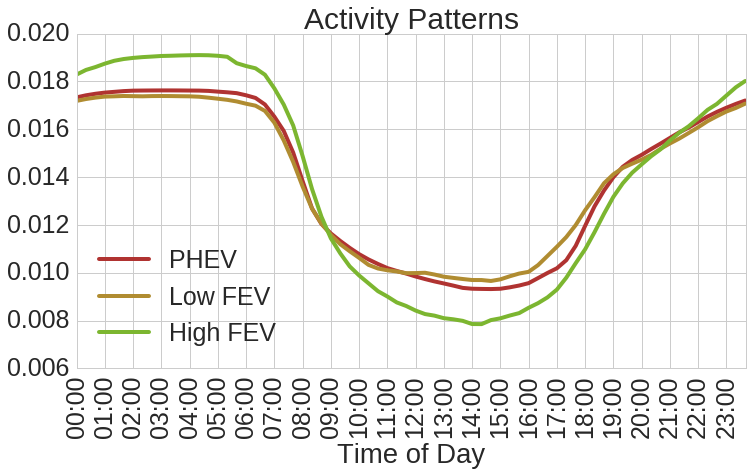

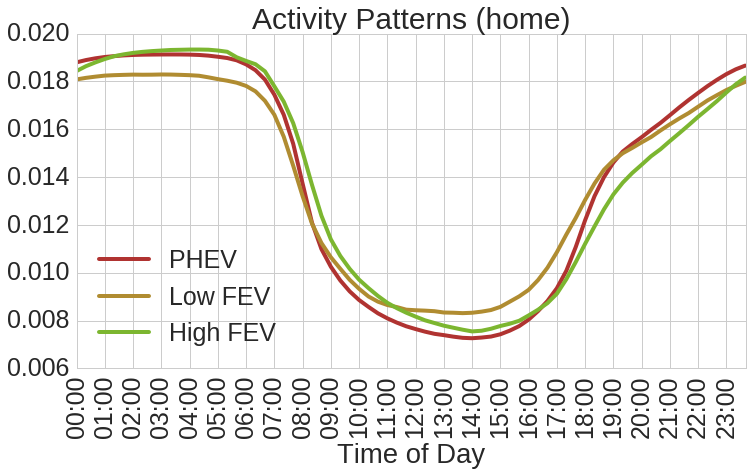

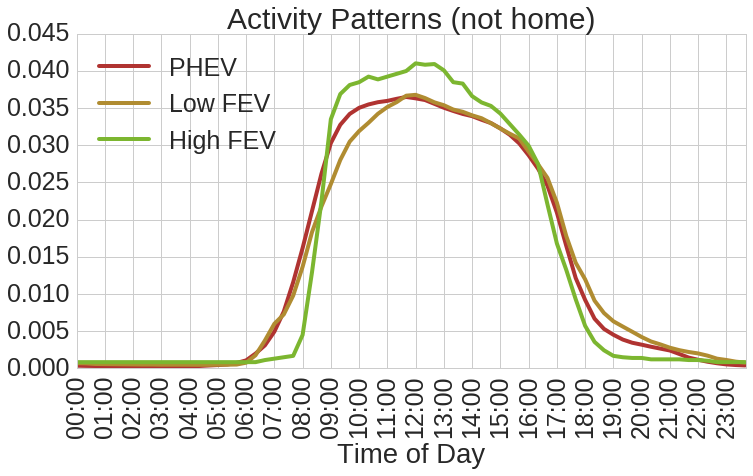

In [325]:
bin_size = 20
xvals = [i * bin_size / 60  for i in range(int(24 * 60 / bin_size))]
yvals = [normed_phev_activity_patterns, normed_low_fev_activity_patterns,
            normed_high_fev_activity_patterns]
times_of_day = ['%d:00' % (i) if i > 9 else '0%d:00' %(i) for i in range(24)]
ylabs = ['PHEV', 'Low FEV', 'High FEV']
simple_plot_mult_dist(xvals, yvals, ylabs, title = 'Activity Patterns', 
    xmax = 23.7, colors = ['phev', 'low', 'high'], xlabel = 'Time of Day', 
     ylabel = '', xticks = times_of_day)

yvals = [normed_phev_activity_patterns_centers_home, normed_low_fev_activity_patterns_centers_home,
            normed_high_fev_activity_patterns_centers_home]
simple_plot_mult_dist(xvals, yvals, ylabs, title = 'Activity Patterns (home)', 
    xmax = 23.7, colors = ['phev', 'low', 'high'], xlabel = 'Time of Day', 
     ylabel = '', xticks = times_of_day)

yvals = [normed_phev_activity_patterns_centers_not_home, normed_low_fev_activity_patterns_centers_not_home,
            normed_high_fev_activity_patterns_centers_not_home]
simple_plot_mult_dist(xvals, yvals, ylabs, title = 'Activity Patterns (not home)', 
    xmax = 23.7, colors = ['phev', 'low', 'high'], xlabel = 'Time of Day', 
     ylabel = '', xticks = times_of_day)

In [326]:
print('Activity Patterns')
battery_size_functions.print_errors(normed_high_fev_activity_patterns, normed_phev_activity_patterns,
                                   ['high fev', 'phev'], max_size = max_dc_20)
battery_size_functions.print_errors(normed_low_fev_activity_patterns, normed_high_fev_activity_patterns,
                                   ['low fev', 'high fev'], max_size = max_dc_20)
battery_size_functions.print_errors(normed_low_fev_activity_patterns, normed_phev_activity_patterns,
                                   ['low fev', 'phev'], max_size = max_dc_20)

Activity Patterns
Errors for high fev and phev:
	Hellinger distance: 0.0294
	Shifting distance: 0.0160
Errors for low fev and high fev:
	Hellinger distance: 0.0364
	Shifting distance: 0.0197
Errors for low fev and phev:
	Hellinger distance: 0.0093
	Shifting distance: 0.0040


In [328]:
all_arrival_distributions_phev = [data_agents[agent]['arrival_dists'][center] 
    for agent in data_agents for center in data_agents[agent]['arrival_dists'] 
                                     if data_agents[agent]['battery_category'] == 'phev']
all_arrival_distributions_low_fev = [data_agents[agent]['arrival_dists'][center] 
    for agent in data_agents for center in data_agents[agent]['arrival_dists']
                                        if data_agents[agent]['battery_category'] == 'fev_low']
all_arrival_distributions_high_fev = [data_agents[agent]['arrival_dists'][center] 
    for agent in data_agents for center in data_agents[agent]['arrival_dists'] 
                                         if data_agents[agent]['battery_category'] == 'fev_high']

phev_arrival_dist = battery_size_functions.sum_distributions(all_arrival_distributions_phev)
low_fev_arrival_dist = battery_size_functions.sum_distributions(all_arrival_distributions_low_fev)
high_fev_arrival_dist = battery_size_functions.sum_distributions(all_arrival_distributions_high_fev)

home_arrival_distributions_phev = [data_agents[agent]['arrival_dists'][center] 
    for agent in data_agents for center in data_agents[agent]['arrival_dists'] 
                                     if data_agents[agent]['battery_category'] == 'phev' and   
            data_agents[agent]['centers_info'][center]['center_type_training'] == 'home']
home_arrival_distributions_low_fev = [data_agents[agent]['arrival_dists'][center] 
    for agent in data_agents for center in data_agents[agent]['arrival_dists']
                                        if data_agents[agent]['battery_category'] == 'fev_low' and  
            data_agents[agent]['centers_info'][center]['center_type_training'] == 'home']
home_arrival_distributions_high_fev = [data_agents[agent]['arrival_dists'][center] 
    for agent in data_agents for center in data_agents[agent]['arrival_dists'] 
                                         if data_agents[agent]['battery_category'] == 'fev_high' and  
            data_agents[agent]['centers_info'][center]['center_type_training'] == 'home']

phev_home_arrival_dist = battery_size_functions.sum_distributions(home_arrival_distributions_phev)
low_fev_home_arrival_dist = battery_size_functions.sum_distributions(home_arrival_distributions_low_fev)
high_fev_home_arrival_dist = battery_size_functions.sum_distributions(home_arrival_distributions_high_fev)


not_home_arrival_distributions_phev = [data_agents[agent]['arrival_dists'][center] 
    for agent in data_agents for center in data_agents[agent]['arrival_dists'] 
                                     if data_agents[agent]['battery_category'] == 'phev' and   
            data_agents[agent]['centers_info'][center]['center_type_training'] == 'not_home']
not_home_arrival_distributions_low_fev = [data_agents[agent]['arrival_dists'][center] 
    for agent in data_agents for center in data_agents[agent]['arrival_dists']
                                        if data_agents[agent]['battery_category'] == 'fev_low' and  
            data_agents[agent]['centers_info'][center]['center_type_training'] == 'not_home']
not_home_arrival_distributions_high_fev = [data_agents[agent]['arrival_dists'][center] 
    for agent in data_agents for center in data_agents[agent]['arrival_dists'] 
                                         if data_agents[agent]['battery_category'] == 'fev_high' and  
            data_agents[agent]['centers_info'][center]['center_type_training'] == 'not_home']

phev_not_home_arrival_dist = battery_size_functions.sum_distributions(not_home_arrival_distributions_phev)
low_fev_not_home_arrival_dist = battery_size_functions.sum_distributions(not_home_arrival_distributions_low_fev)
high_fev_not_home_arrival_dist = battery_size_functions.sum_distributions(not_home_arrival_distributions_high_fev)

normed_phev_arrival_dist = phev_arrival_dist / numpy.sum(phev_arrival_dist)
normed_low_fev_arrival_dist = low_fev_arrival_dist / numpy.sum(low_fev_arrival_dist)
normed_high_fev_arrival_dist = high_fev_arrival_dist / numpy.sum(high_fev_arrival_dist)
normed_phev_home_arrival_dist = phev_home_arrival_dist / numpy.sum(phev_home_arrival_dist)
normed_low_fev_home_arrival_dist = low_fev_home_arrival_dist / numpy.sum(low_fev_home_arrival_dist)
normed_high_fev_home_arrival_dist = high_fev_home_arrival_dist / numpy.sum(high_fev_home_arrival_dist)
normed_phev_not_home_arrival_dist = phev_not_home_arrival_dist / numpy.sum(phev_not_home_arrival_dist)
normed_low_fev_not_home_arrival_dist = low_fev_not_home_arrival_dist / numpy.sum(low_fev_not_home_arrival_dist)
normed_high_fev_not_home_arrival_dist = high_fev_not_home_arrival_dist / numpy.sum(high_fev_not_home_arrival_dist)

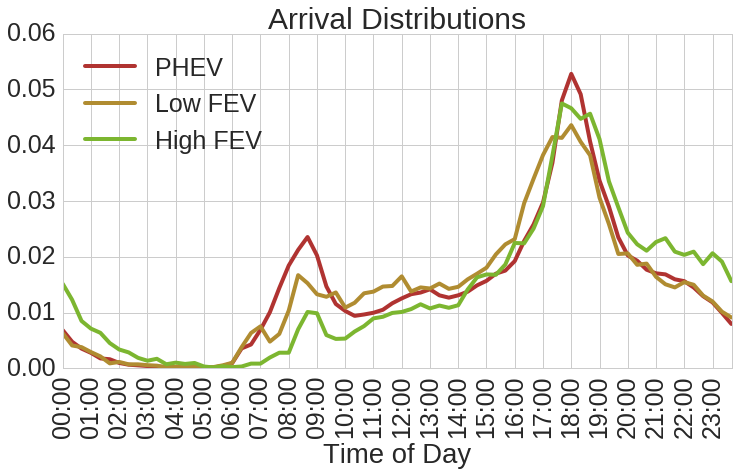

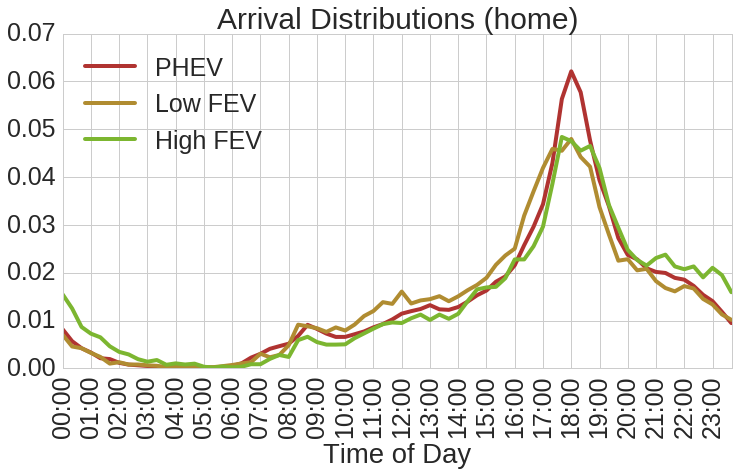

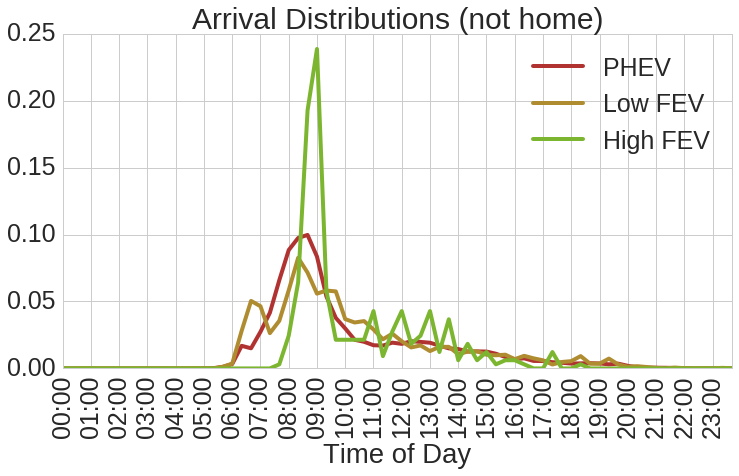

In [329]:
bin_size = 20
xvals = [i * bin_size / 60  for i in range(int(24 * 60 / bin_size))]
yvals = [normed_phev_arrival_dist, normed_low_fev_arrival_dist,
            normed_high_fev_arrival_dist]
times_of_day = ['%d:00' % (i) if i > 9 else '0%d:00' %(i) for i in range(24)]
ylabs = ['PHEV', 'Low FEV', 'High FEV']
simple_plot_mult_dist(xvals, yvals, ylabs, title = 'Arrival Distributions', 
    xmax = 23.7, colors = ['phev', 'low', 'high'], xlabel = 'Time of Day', 
     ylabel = '', xticks = times_of_day)

yvals = [normed_phev_home_arrival_dist, normed_low_fev_home_arrival_dist,
            normed_high_fev_home_arrival_dist]
simple_plot_mult_dist(xvals, yvals, ylabs, title = 'Arrival Distributions (home)', 
    xmax = 23.7, colors = ['phev', 'low', 'high'], xlabel = 'Time of Day', 
     ylabel = '', xticks = times_of_day)

yvals = [normed_phev_not_home_arrival_dist, normed_low_fev_not_home_arrival_dist,
            normed_high_fev_not_home_arrival_dist]
simple_plot_mult_dist(xvals, yvals, ylabs, title = 'Arrival Distributions (not home)', 
    xmax = 23.7, colors = ['phev', 'low', 'high'], xlabel = 'Time of Day', 
     ylabel = '', xticks = times_of_day)

In [584]:
print('Activity Patterns')
battery_size_functions.print_errors(normed_high_fev_arrival_dist, normed_phev_arrival_dist,
                                   ['high fev', 'phev'], max_size = max_dc_20)
battery_size_functions.print_errors(normed_low_fev_arrival_dist, normed_high_fev_arrival_dist,
                                   ['low fev', 'high fev'], max_size = max_dc_20)
battery_size_functions.print_errors(normed_low_fev_arrival_dist, normed_phev_arrival_dist,
                                   ['low fev', 'phev'], max_size = max_dc_20)

Activity Patterns
Errors for high fev and phev:
	Hellinger distance: 0.1649
	Shifting distance: 0.0613
Errors for low fev and high fev:
	Hellinger distance: 0.1542
	Shifting distance: 0.0599
Errors for low fev and phev:
	Hellinger distance: 0.0782
	Shifting distance: 0.0162


## Example transformed user

In [330]:
bin_size = 20
dc_dists_agents = {}
for ID in data_agents:
    dc_dists_agents[ID] = battery_size_functions.sum_distributions(data_agents_20[ID]['disconnection_duration_dists'])

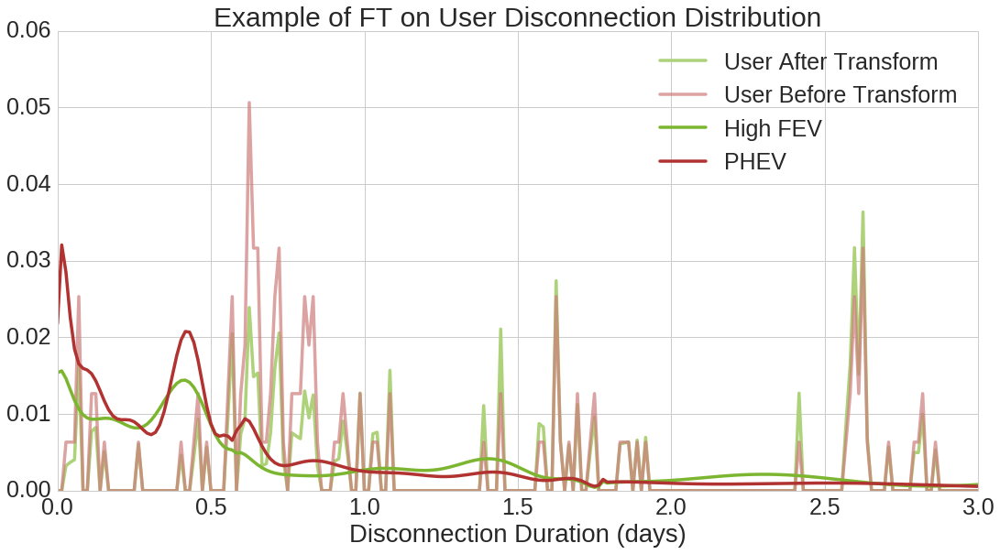

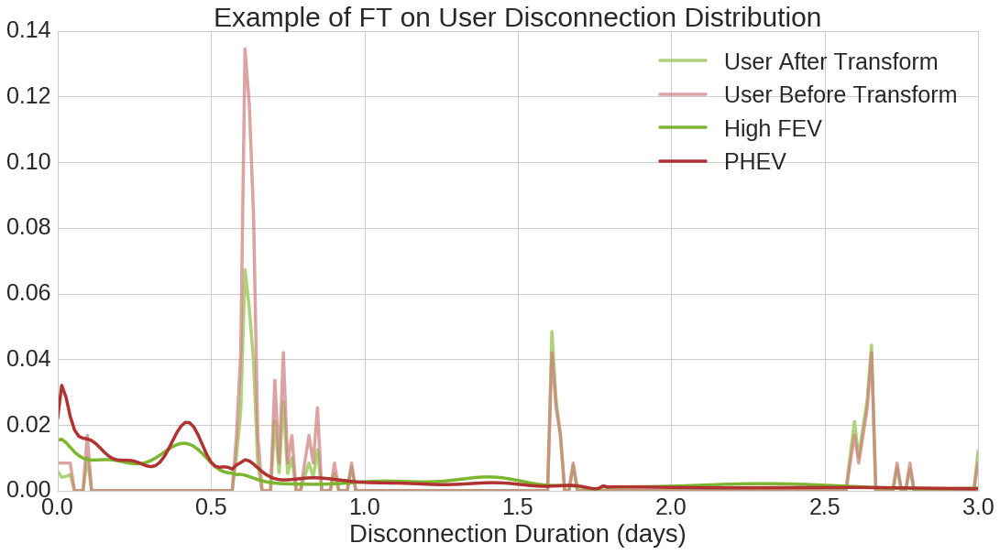

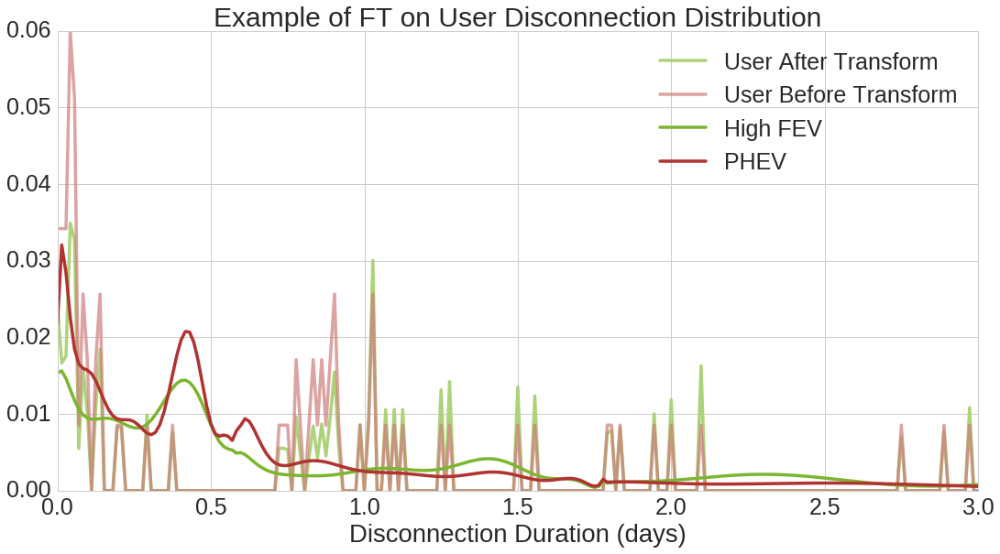

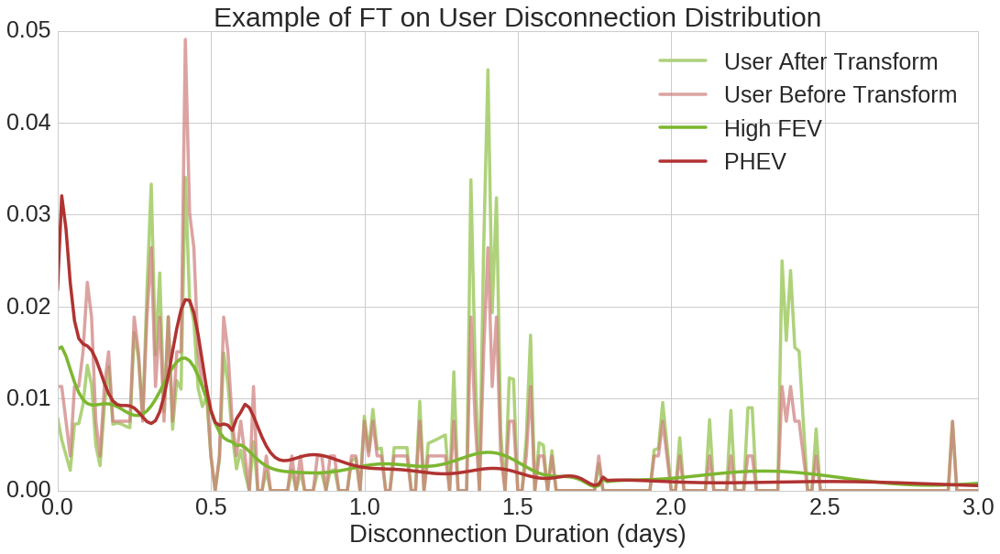

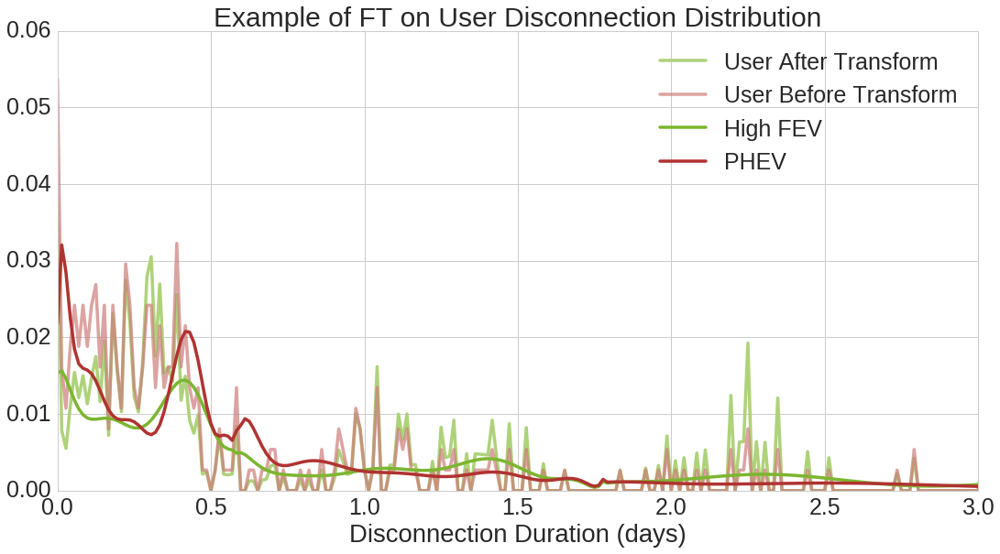

...

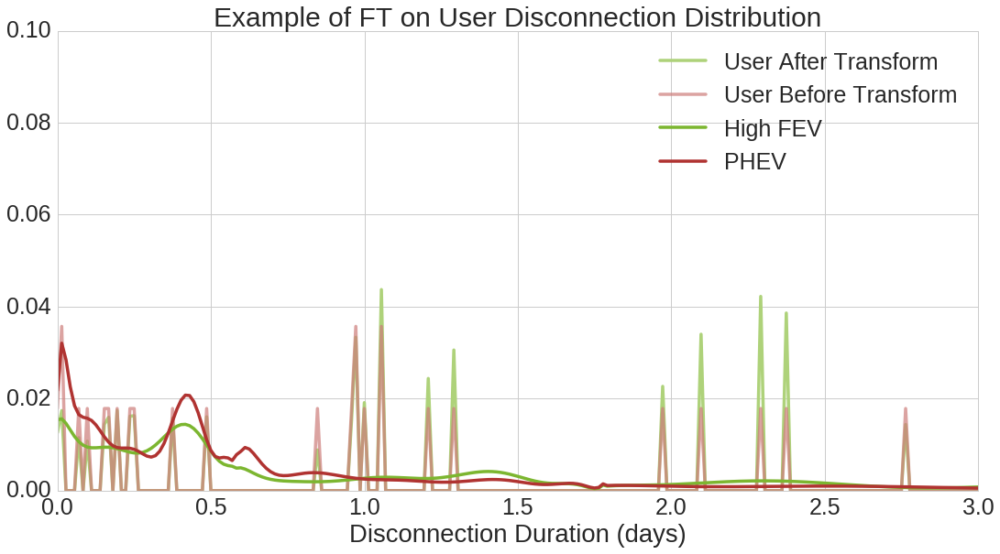

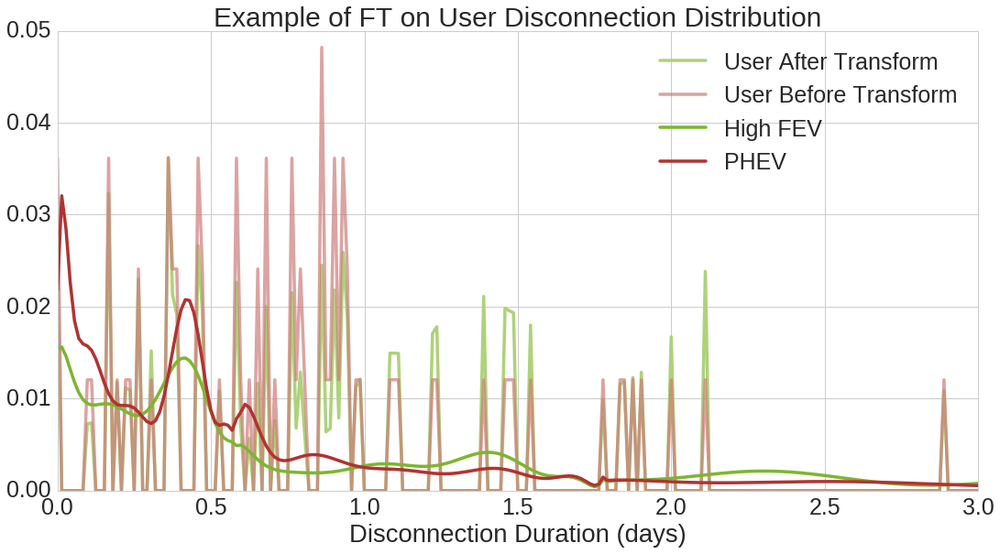

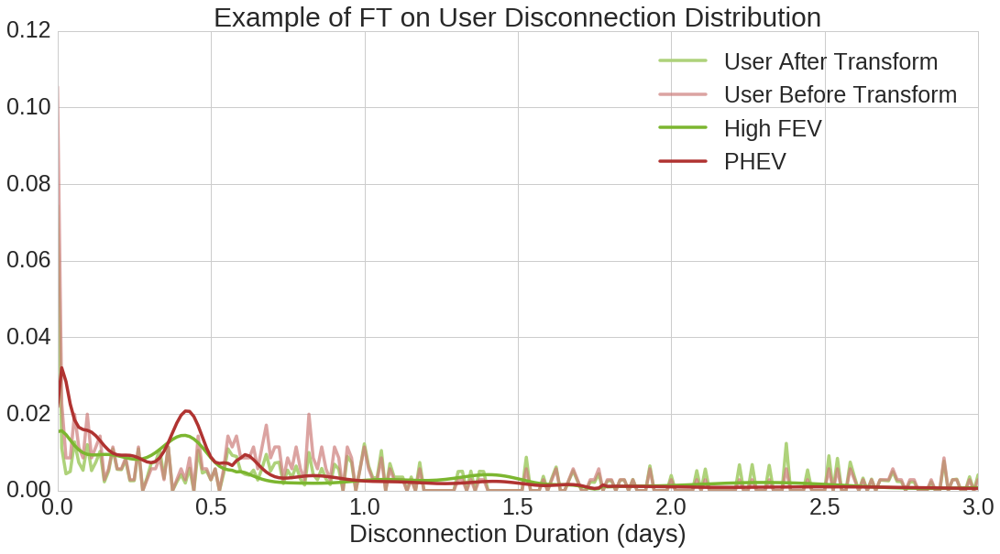

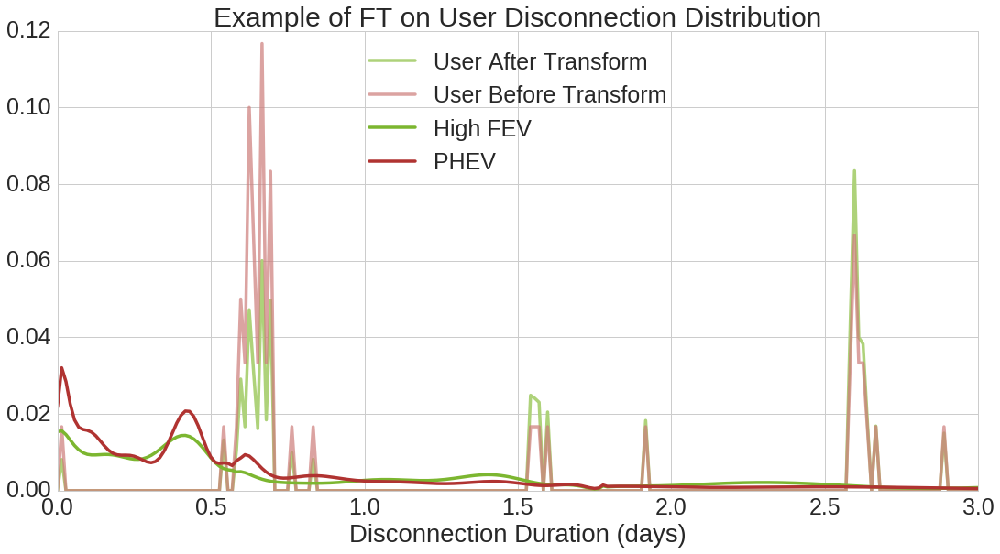

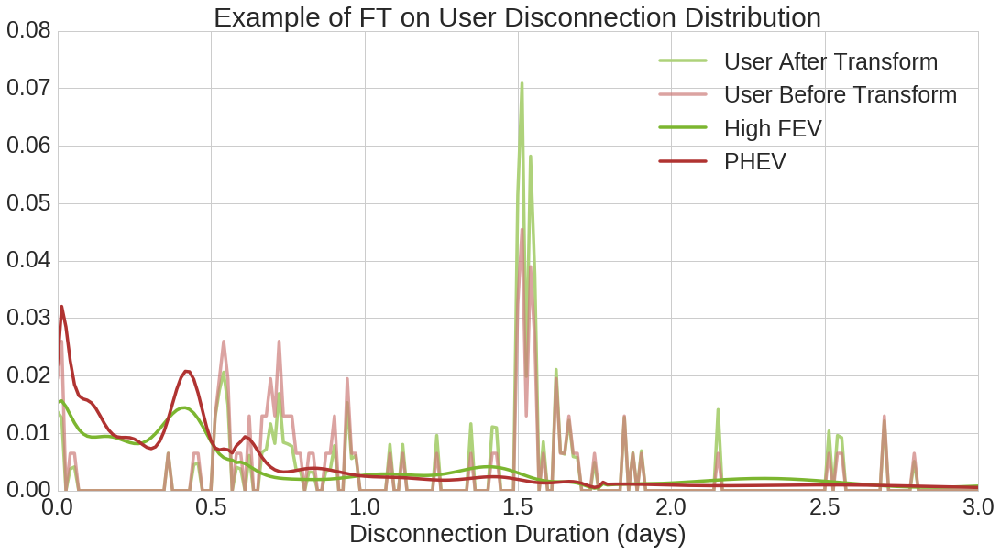

In [363]:
t = battery_size_functions.get_transform_factors(disconnection_distribution_phev_20[:max_dc_20], 
                                                 disconnection_distribution_high_fev_20[:max_dc_20])
xvals = [i * bin_size / 60 / 24 for i in range(len(t))]
for i, ID in enumerate(dc_dists_agents):
    if i < 80:
        continue
    if i > 100:
        break
    if data_agents[ID]['battery_category'] != 'phev':
        continue
    dist = list(dc_dists_agents[ID])
    while (len(dist) < len(t)):
            dist.append(0.0)
    dist = dist[:len(t)]
    dist = battery_size_functions.convert_to_normed_list(dist, len(t))
    new_dist = battery_size_functions.transform(dist, t)
    simple_plot_mult_dist(xvals, [new_dist, dist,  disconnection_distribution_high_fev_20[:max_dc_20],
                                  disconnection_distribution_phev_20[:max_dc_20]], 
                          ['User After Transform','User Before Transform', 'High FEV', 'PHEV'], xmax = 3, linewidth = 3.5,
                          colors = ['high_light', 'phev_light', 'high', 'phev'],
                         alpha = [1.0, 0.7, 1.0, 1.0], fig_size = [18, 9],
                         title = 'Example of FT on User Disconnection Distribution',
                         xlabel = 'Disconnection Duration (days)')

## Transformed distributions

In [374]:
print('Bin size 20')
bin_size = 20
phev_to_high_resulting_dc_data_20, e_compute_phev_to_high_dc_20, e_naive_phev_to_high_dc_20, e_trans_phev_to_high_dc_20 = battery_size_functions.validate_disconnection_patterns(phev_to_high_transformed_data_20, 
    disconnection_distribution_high_fev_20, disconnection_distribution_phev_20, bin_size = bin_size)
max_length = min(max_dc_20, len(phev_to_high_resulting_dc_data_20))
battery_size_functions.print_scores(e_compute_phev_to_high_dc_20, e_naive_phev_to_high_dc_20, e_trans_phev_to_high_dc_20)

print('Bin size 60')
bin_size = 60
phev_to_high_resulting_dc_data_60, e_compute_phev_to_high_dc_60, e_naive_phev_to_high_dc_60, e_trans_phev_to_high_dc_60 = battery_size_functions.validate_disconnection_patterns(phev_to_high_transformed_data_60, 
    disconnection_distribution_high_fev_60, disconnection_distribution_phev_60, bin_size = bin_size)
max_length = min(max_dc_60, len(phev_to_high_resulting_dc_data_60))
battery_size_functions.print_scores(e_compute_phev_to_high_dc_60, e_naive_phev_to_high_dc_60, e_trans_phev_to_high_dc_60)

print('Bin size 120')
bin_size = 120
phev_to_high_resulting_dc_data_120, e_compute_phev_to_high_dc_120, e_naive_phev_to_high_dc_120, e_trans_phev_to_high_dc_120 = battery_size_functions.validate_disconnection_patterns(phev_to_high_transformed_data_120, 
    disconnection_distribution_high_fev_120, disconnection_distribution_phev_120, bin_size = bin_size)
max_length = min(max_dc_120, len(phev_to_high_resulting_dc_data_120))
battery_size_functions.print_scores(e_compute_phev_to_high_dc_120, e_naive_phev_to_high_dc_120, e_trans_phev_to_high_dc_120)

Bin size 20
pass on error not 0 (-0.0013) at end of determining shifting distance
Errors: 		MAE;		Hellinger;	Shifting
Target and prediction: 	0.0070; 	0.1039, 	0.0069
Target and origin: 	0.0139; 	0.1717; 	0.0215
Origin and prediction: 	0.0158; 	0.1971; 	0.0267

MAE		 0.007; 0.499
Hellinger	 0.104; 0.394
Shifting	 0.007; 0.680
Bin size 60
pass on error not 0 (-0.0012) at end of determining shifting distance
Errors: 		MAE;		Hellinger;	Shifting
Target and prediction: 	0.0189; 	0.0850, 	0.0124
Target and origin: 	0.0416; 	0.1678; 	0.0230
Origin and prediction: 	0.0521; 	0.2063; 	0.0338

MAE		 0.019; 0.545
Hellinger	 0.085; 0.493
Shifting	 0.012; 0.458
Bin size 120
pass on error not 0 (-0.0011) at end of determining shifting distance
Errors: 		MAE;		Hellinger;	Shifting
Target and prediction: 	0.0387; 	0.0822, 	0.0128
Target and origin: 	0.0808; 	0.1653; 	0.0231
Origin and prediction: 	0.1074; 	0.2052; 	0.0342

MAE		 0.039; 0.521
Hellinger	 0.082; 0.503
Shifting	 0.013; 0.446


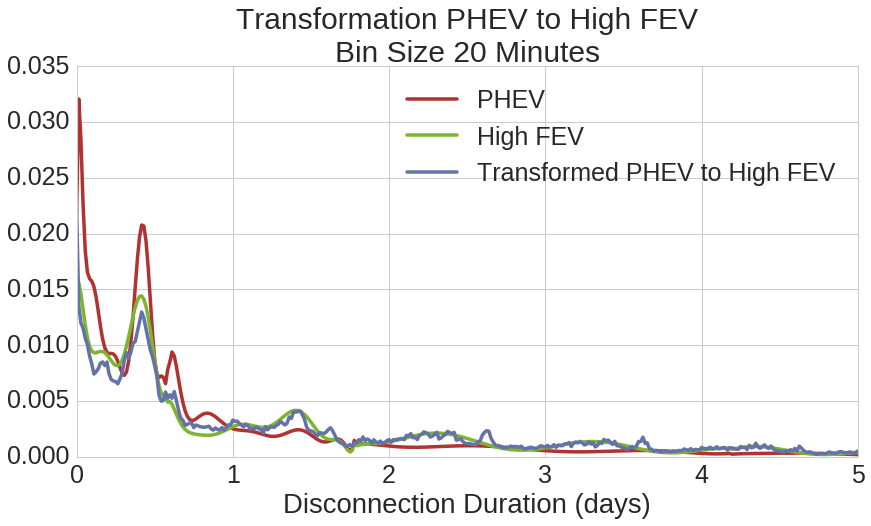

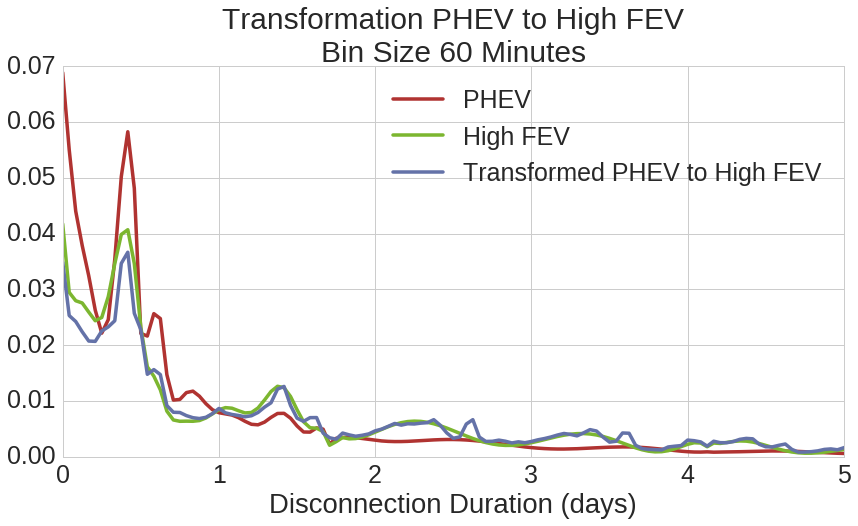

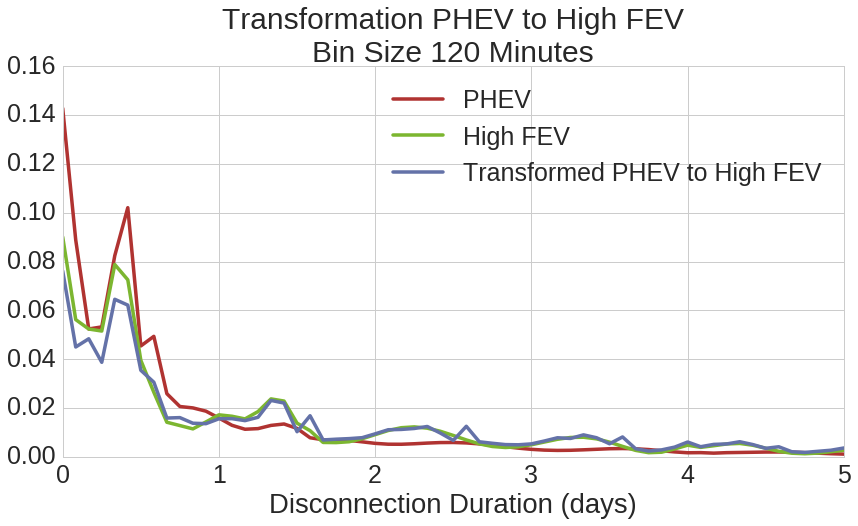

In [375]:
bin_size = 20
xvals = [i * bin_size / 60 / 24 for i in range(max_dc_20)]
yvals = [disconnection_distribution_phev_20[:max_dc_20], disconnection_distribution_high_fev_20[:max_dc_20],
        phev_to_high_resulting_dc_data_20[:max_dc_20]]
ylabels = ['PHEV', 'High FEV', 'Transformed PHEV to High FEV']
simple_plot_mult_dist(xvals, yvals, ylabels, xmax = 5, linewidth = 3.5,
                        colors = ['phev', 'high', 'main'],
                         title = 'Transformation PHEV to High FEV\nBin Size 20 Minutes',
                         xlabel = 'Disconnection Duration (days)',
                         fig_size = [14,7])

bin_size = 60
xvals = [i * bin_size / 60 / 24 for i in range(max_dc_60)]
yvals = [disconnection_distribution_phev_60[:max_dc_60], disconnection_distribution_high_fev_60[:max_dc_60],
        phev_to_high_resulting_dc_data_60[:max_dc_60]]
ylabels = ['PHEV', 'High FEV', 'Transformed PHEV to High FEV']
simple_plot_mult_dist(xvals, yvals, ylabels, xmax = 5, linewidth = 3.5,
                        colors = ['phev', 'high', 'main'],
                         title = 'Transformation PHEV to High FEV\nBin Size 60 Minutes',
                         xlabel = 'Disconnection Duration (days)',
                         fig_size = [14,7])

bin_size = 120
xvals = [i * bin_size / 60 / 24 for i in range(max_dc_120)]
yvals = [disconnection_distribution_phev_120[:max_dc_120], disconnection_distribution_high_fev_120[:max_dc_120],
        phev_to_high_resulting_dc_data_120[:max_dc_120]]
ylabels = ['PHEV', 'High FEV', 'Transformed PHEV to High FEV']
simple_plot_mult_dist(xvals, yvals, ylabels, xmax = 5, linewidth = 3.5,
                        colors = ['phev', 'high', 'main'],
                         title = 'Transformation PHEV to High FEV\nBin Size 120 Minutes',
                         xlabel = 'Disconnection Duration (days)',
                         fig_size = [14,7])





In [376]:
print('Bin size 20')
bin_size = 20
phev_to_high_resulting_con_data_20, e_compute_phev_to_high_con_20, e_naive_phev_to_high_con_20, e_trans_phev_to_high_con_20 = battery_size_functions.validate_connection_patterns(phev_to_high_transformed_data_20, 
    connection_distribution_high_fev_20, connection_distribution_phev_20, bin_size = bin_size)
max_length = min(max_con_20, len(phev_to_high_resulting_con_data_20))
battery_size_functions.print_scores(e_compute_phev_to_high_con_20, e_naive_phev_to_high_con_20, e_trans_phev_to_high_con_20)

print('Bin size 60')
bin_size = 60
phev_to_high_resulting_con_data_60, e_compute_phev_to_high_con_60, e_naive_phev_to_high_con_60, e_trans_phev_to_high_con_60 = battery_size_functions.validate_connection_patterns(phev_to_high_transformed_data_60, 
    connection_distribution_high_fev_60, connection_distribution_phev_60, bin_size = bin_size)
max_length = min(max_con_60, len(phev_to_high_resulting_con_data_60))
battery_size_functions.print_scores(e_compute_phev_to_high_con_60, e_naive_phev_to_high_con_60, e_trans_phev_to_high_con_60)

print('Bin size 120')
bin_size = 120
phev_to_high_resulting_con_data_120, e_compute_phev_to_high_con_120, e_naive_phev_to_high_con_120, e_trans_phev_to_high_con_120 = battery_size_functions.validate_connection_patterns(phev_to_high_transformed_data_120, 
    connection_distribution_high_fev_120, connection_distribution_phev_120, bin_size = bin_size)
max_length = min(max_con_120, len(phev_to_high_resulting_con_data_120))
battery_size_functions.print_scores(e_compute_phev_to_high_con_120, e_naive_phev_to_high_con_120, e_trans_phev_to_high_con_120)

Bin size 20
pass on error not 0 (-0.0013) at end of determining shifting distance
Errors: 		MAE;		Hellinger;	Shifting
Target and prediction: 	0.0679; 	0.1075, 	0.0201
Target and origin: 	0.0723; 	0.1017; 	0.0252
Origin and prediction: 	0.0476; 	0.0994; 	0.0073

MAE		 0.068; 0.061
Hellinger	 0.108; -0.057
Shifting	 0.020; 0.202
Bin size 60
pass on error not 0 (-0.0013) at end of determining shifting distance
Errors: 		MAE;		Hellinger;	Shifting
Target and prediction: 	0.1469; 	0.0700, 	0.0156
Target and origin: 	0.1970; 	0.0972; 	0.0273
Origin and prediction: 	0.1268; 	0.0651; 	0.0141

MAE		 0.147; 0.254
Hellinger	 0.070; 0.279
Shifting	 0.016; 0.427
Bin size 120
pass on error not 0 (-0.0014) at end of determining shifting distance
Errors: 		MAE;		Hellinger;	Shifting
Target and prediction: 	0.3448; 	0.0811, 	0.0200
Target and origin: 	0.4165; 	0.0965; 	0.0320
Origin and prediction: 	0.2959; 	0.0817; 	0.0181

MAE		 0.345; 0.172
Hellinger	 0.081; 0.159
Shifting	 0.020; 0.377


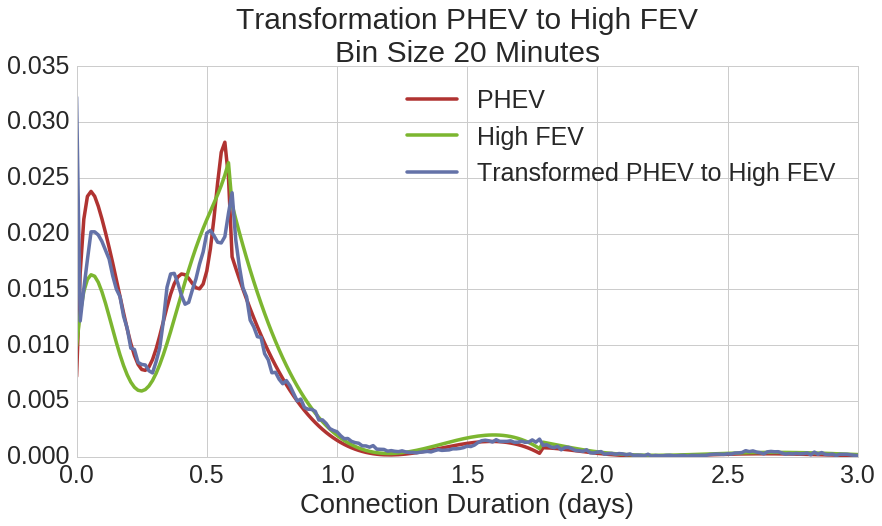

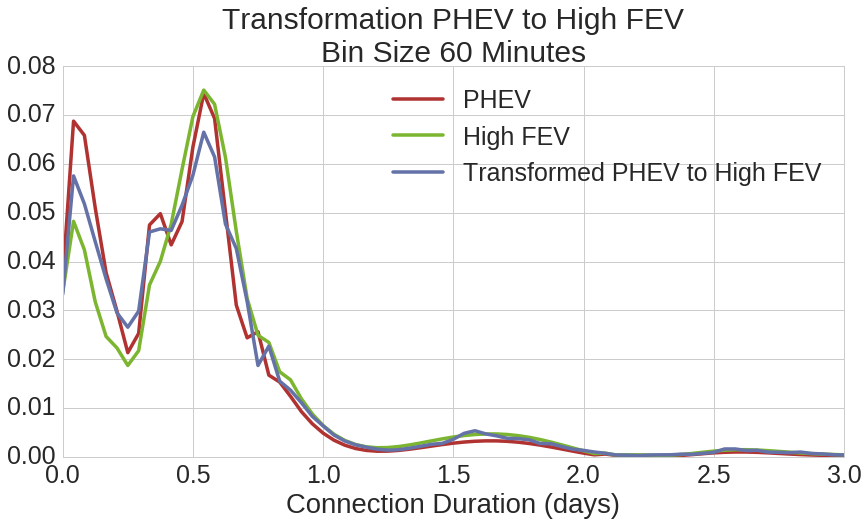

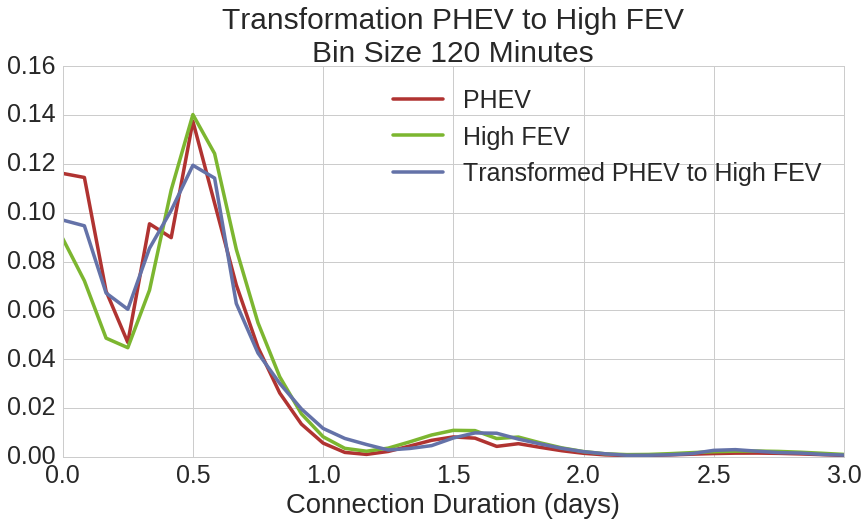

In [377]:
bin_size = 20
xvals = [i * bin_size / 60 / 24 for i in range(max_con_20)]
yvals = [connection_distribution_phev_20[:max_con_20], connection_distribution_high_fev_20[:max_con_20],
        phev_to_high_resulting_con_data_20[:max_con_20]]
ylabels = ['PHEV', 'High FEV', 'Transformed PHEV to High FEV']
simple_plot_mult_dist(xvals, yvals, ylabels, xmax = 3, linewidth = 3.5,
                        colors = ['phev', 'high', 'main'],
                         title = 'Transformation PHEV to High FEV\nBin Size 20 Minutes',
                         xlabel = 'Connection Duration (days)',
                     fig_size = [14, 7])

bin_size = 60
xvals = [i * bin_size / 60 / 24 for i in range(max_con_60)]
yvals = [connection_distribution_phev_60[:max_con_60], connection_distribution_high_fev_60[:max_con_60],
        phev_to_high_resulting_con_data_60[:max_con_60]]
ylabels = ['PHEV', 'High FEV', 'Transformed PHEV to High FEV']
simple_plot_mult_dist(xvals, yvals, ylabels, xmax = 3, linewidth = 3.5,
                        colors = ['phev', 'high', 'main'],
                         title = 'Transformation PHEV to High FEV\nBin Size 60 Minutes',
                         xlabel = 'Connection Duration (days)',
                     fig_size = [14, 7])

bin_size = 120
xvals = [i * bin_size / 60 / 24 for i in range(max_con_120)]
yvals = [connection_distribution_phev_120[:max_con_120], connection_distribution_high_fev_120[:max_con_120],
        phev_to_high_resulting_con_data_120[:max_con_120]]
ylabels = ['PHEV', 'High FEV', 'Transformed PHEV to High FEV']
simple_plot_mult_dist(xvals, yvals, ylabels, xmax = 3, linewidth = 3.5,
                        colors = ['phev', 'high', 'main'],
                         title = 'Transformation PHEV to High FEV\nBin Size 120 Minutes',
                         xlabel = 'Connection Duration (days)',
                     fig_size = [14, 7])

## Case study results

## Distances categories

In [493]:
filename = 'data/battery_size/distances_classes_1day_shifting.pkl'
with open(filename, 'rb') as f:
    distances_classes_shifting_20 = pickle.load(f)
    
filename = 'data/battery_size/distances_classes_1day.pkl'
with open(filename, 'rb') as f:
    distances_classes_hellinger_20 = pickle.load(f)
    
filename = 'data/battery_size/distances_classes_1day_bin120_shifting.pkl'
with open(filename, 'rb') as f:
    distances_classes_shifting_120 = pickle.load(f)
    
filename = 'data/battery_size/distances_classes_1day_bin120.pkl'
with open(filename, 'rb') as f:
    distances_classes_hellinger_120 = pickle.load(f)
    
        

In [512]:
def plot_distances(distances_classes, con_or_dc, fig_name, xlabel, title, xmax = 1.0):
    ht = {'phev_phev': 'PHEV - PHEV', 'high_high': 'High FEV - High FEV', 'low_low': 'Low FEV - Low FEV', 
          'phev_low': 'PHEV - Low FEV', 'phev_high': 'PHEV - High FEV', 'low_high': 'Low FEV - High FEV'}
    for key in ht:
        seaborn.set(style='whitegrid', font_scale=2.5)
        fig = plt.figure(figsize=(12, 6))
    #     print(len(distances_classes['dc'][key]))
        plt.hist(list(distances_classes[con_or_dc][key]), bins = 50, color = my_colors['main_light'])
        plt.title(title + '\n' + ht[key])
        plt.xlim(0,xmax)
        plt.xlabel(xlabel)
        plt.ylabel('Frequency')
        this_fig_name = fig_name + key
        plt.savefig(save_dir + this_fig_name + '.png',bbox_inches='tight')
        plt.show()
# keys = ['phev_phev', 'high_high', 'low_low', 'phev_low', 'phev_high', 'low_high']
# save_dir = 'data/experiment_figures/battery_size/ugly_figures_thesis/'
# for key in keys:
#     seaborn.set(style='whitegrid', font_scale=2.5)
#     fig = plt.figure(figsize=(12, 6))
# #     print(len(distances_classes['dc'][key]))
#     plt.hist(list(distances_classes_helling['con'][key]), bins = 30)
#     plt.title("Hellinger Distance (20min bin) \n" + key + " (Connection)")
#     plt.xlim(0,1.0)
#     plt.xlabel('Distance')
#     plt.ylabel('Frequency')
# #     plt.show()
#     fig_name = 'distances_con_hellinger_' + key 
#     plt.savefig(save_dir + fig_name + '.png',bbox_inches='tight')
# #     plt.close(fig)



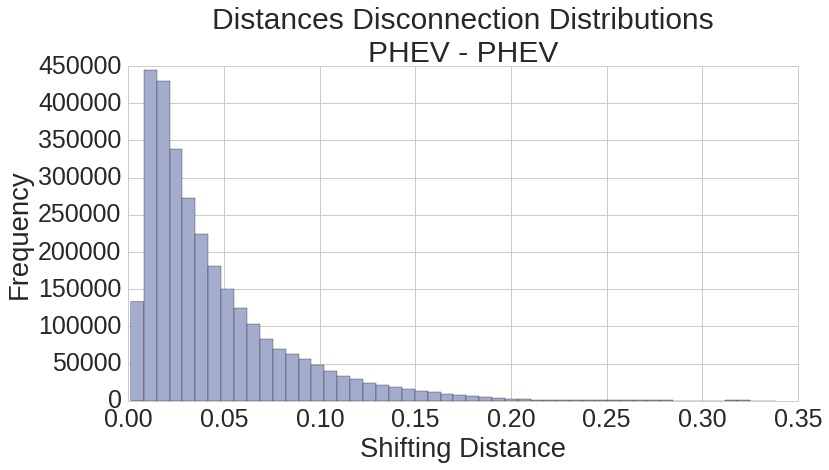

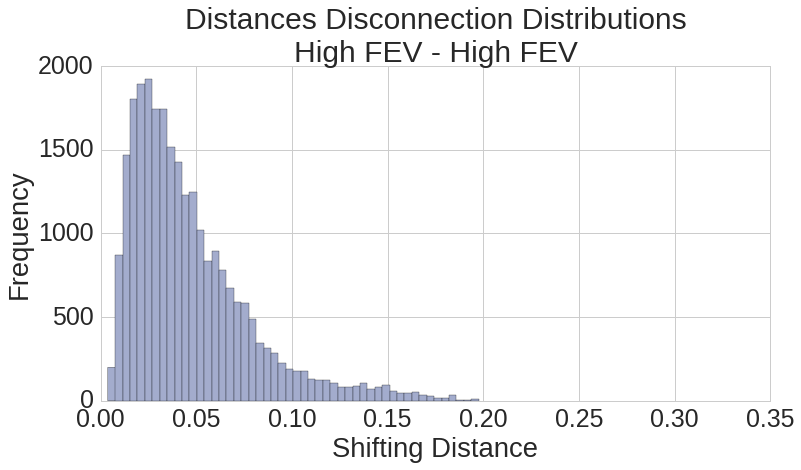

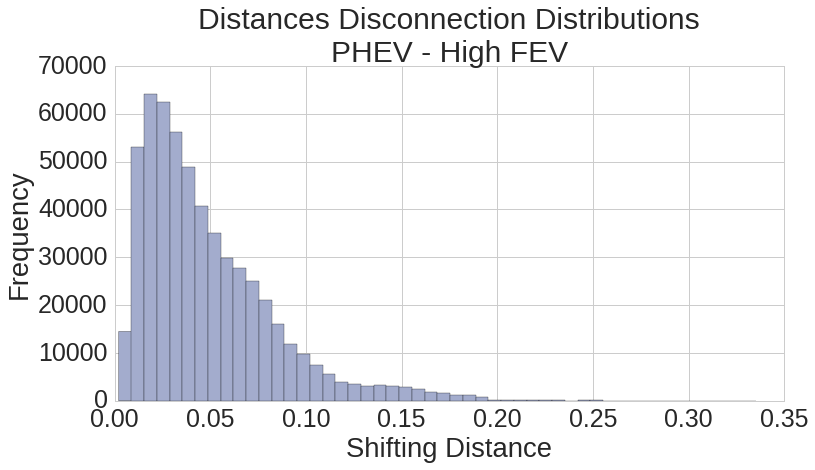

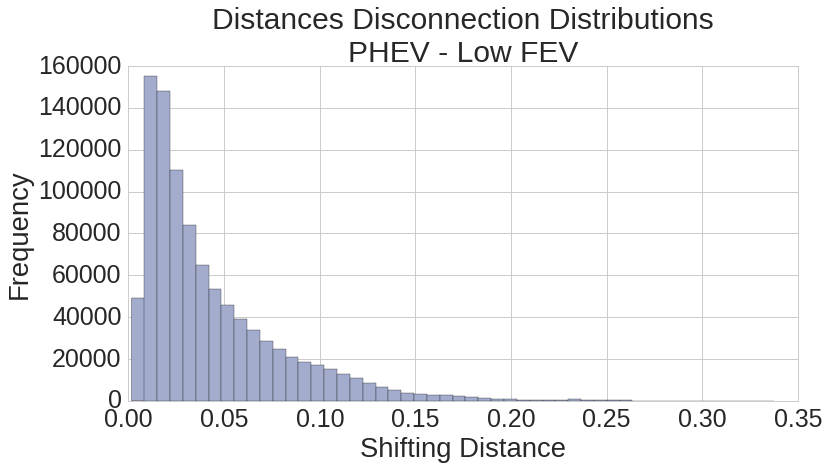

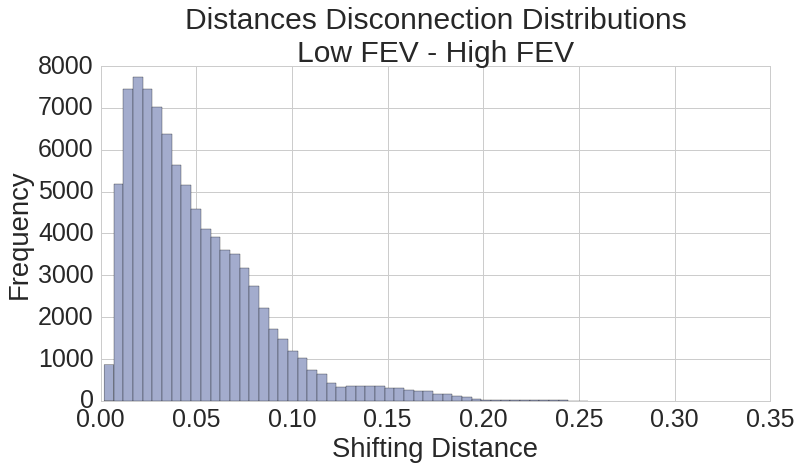

...

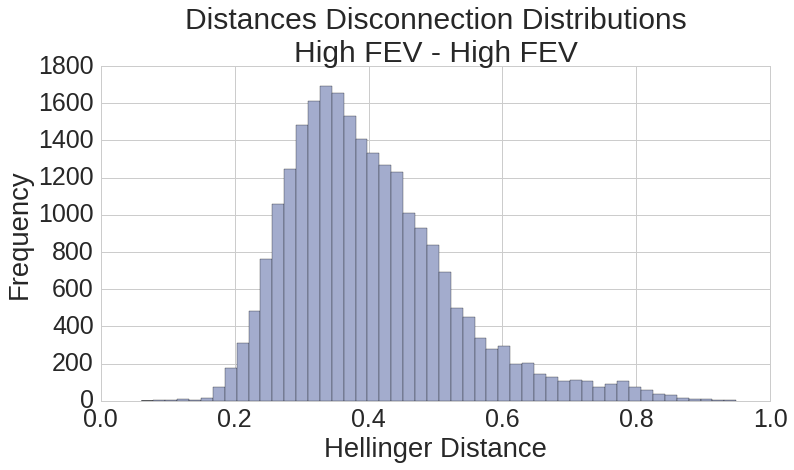

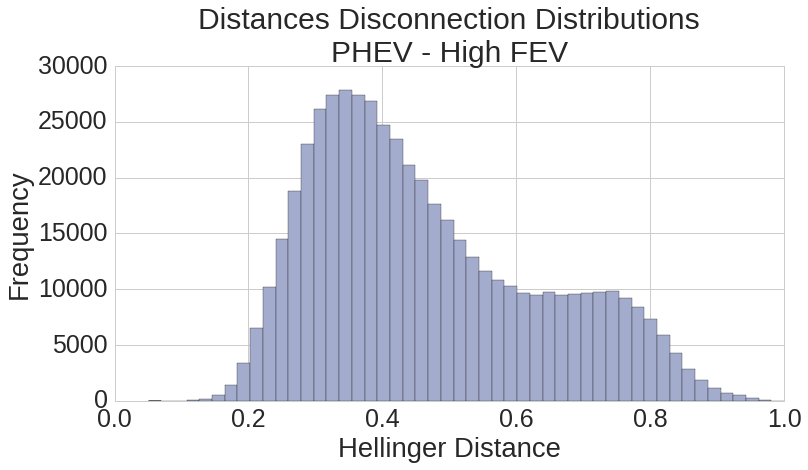

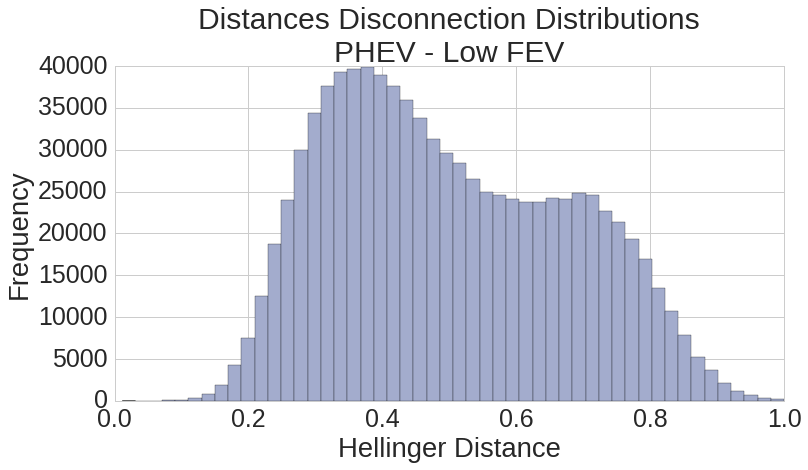

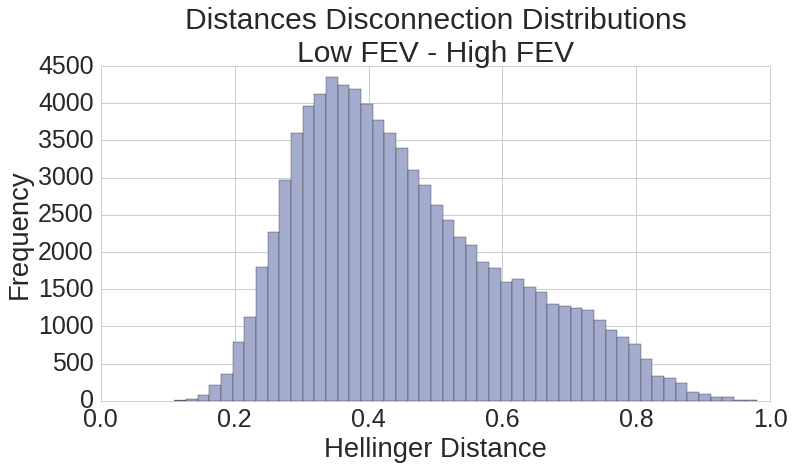

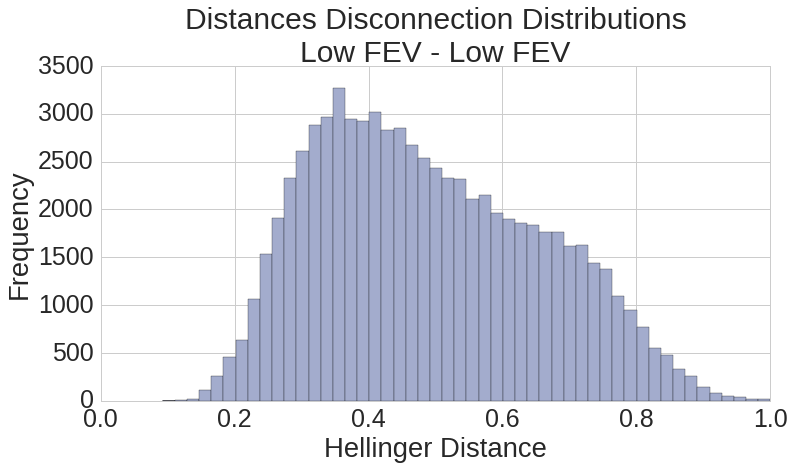

In [515]:
plot_distances(distances_classes_shifting_20, 'dc', 'distances_dc_shifting_bin20__', 'Shifting Distance',
              'Distances Disconnection Distributions', xmax = 0.35)
plot_distances(distances_classes_shifting_20, 'con', 'distances_con_shifting_bin20_', 'Shifting Distance',
              'Distances Connection Distributions', xmax = 0.35)
plot_distances(distances_classes_hellinger_20, 'dc', 'distances_dc_hellinger_bin20_', 'Hellinger Distance',
              'Distances Disconnection Distributions')
plot_distances(distances_classes_hellinger_20, 'con', 'distances_con_hellinger_bin20_', 'Hellinger Distance',
              'Distances Connection Distributions')
plot_distances(distances_classes_shifting_120, 'dc', 'distances_dc_shifting_bin120_', 'Shifting Distance',
              'Distances Disconnection Distributions', xmax = 0.35)
plot_distances(distances_classes_shifting_120, 'con', 'distances_con_shifting_bin120_', 'Shifting Distance',
              'Distances Connection Distributions', xmax = 0.35)
plot_distances(distances_classes_hellinger_120, 'dc', 'distances_dc_hellinger_bin120_', 'Hellinger Distance',
              'Distances Disconnection Distributions')
plot_distances(distances_classes_hellinger_120, 'con', 'distances_con_hellinger_bin120_', 'Hellinger Distance',
              'Distances Disconnection Distributions')

## Fitting distributions

In [382]:
none_fit = [data_agents_20[agent]['overall_disconnection_distribution'] 
    for agent in data_agents if data_agents_20[agent]['battery_category'] == 'fev_high']
none_fit = battery_size_functions.sum_distributions(none_fit)
none_fit = battery_size_functions.convert_to_normed_list(none_fit, max_dc_20, fill_with = 0.0)
fit = battery_size_functions.get_high_range_fit_dist(0, max_dc_20, 
                                none_fit, plot_full_fit = False)

/usr/local/lib/python3.4/dist-packages/numpy/lib/polynomial.py:594: RankWarning: Polyfit may be poorly conditioned
  warnings.warn(msg, RankWarning)
/usr/local/lib/python3.4/dist-packages/numpy/lib/polynomial.py:594: RankWarning: Polyfit may be poorly conditioned
  warnings.warn(msg, RankWarning)
/usr/local/lib/python3.4/dist-packages/numpy/lib/polynomial.py:594: RankWarning: Polyfit may be poorly conditioned
  warnings.warn(msg, RankWarning)


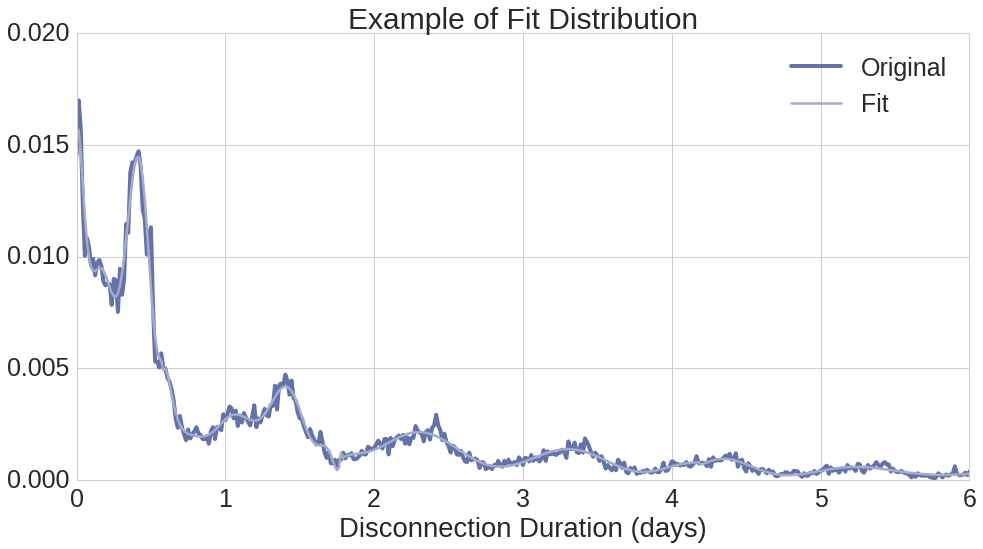

In [408]:
bin_size = 20
xvals = [i * bin_size / 60 / 24 for i in range(max_dc_20)]
yvals = [none_fit[:max_dc_20], fit[:max_dc_20]]
ylabels = ['Original', 'Fit']
simple_plot_mult_dist(xvals, yvals, ylabels, xmax = 6, linewidth = [4,2.5],
                        colors = ['main', 'main_light'],
                         title = 'Example of Fit Distribution',
                         xlabel = 'Disconnection Duration (days)',
                     xmin = 0, fig_size = [16,8], alpha = [1.0, 1.0], ymin = 0)




## Skipping transform

In [447]:
def get_dist_skipping_probs(target_dist, origin_dist, bin_size, printing = False):
    if len(target_dist) != len(origin_dist):
        print('Target and origin distribution in get_dist_skipping_probs should be of same length, not %d and %d' %
             (len(target_dist), len(origin_dist)))
    nr_bins_per_day = int(60 * 24 / bin_size)
    nr_of_days = len(target_dist) / nr_bins_per_day
    if abs(nr_of_days % 1) > 0:
        nr_of_days = int(nr_of_days + 1)
    else:
        nr_of_days = int(nr_of_days)
    dist_probs = []
    for day in range(nr_of_days):
        if day == 0:
            disregard_part = 0.25
            day_target = sum(target_dist[int(disregard_part*nr_bins_per_day):int((day+1)*nr_bins_per_day)])
            day_origin = sum(origin_dist[int(disregard_part*nr_bins_per_day):int((day+1)*nr_bins_per_day)])
            skip_prob_day = skip_prob(day_target, day_origin)
            dist_probs += [skip_prob_day] * nr_bins_per_day
        else:
            day_target = sum(target_dist[int(day*nr_bins_per_day):int((day+1)*nr_bins_per_day)])
            day_origin = sum(origin_dist[int(day*nr_bins_per_day):int((day+1)*nr_bins_per_day)])
            skip_prob_day = skip_prob(day_target, day_origin)            
            dist_probs += [skip_prob_day] * nr_bins_per_day
        if printing:
            print('Evaluating bins %d to %d' %(int(day*nr_bins_per_day), int((day+1)*nr_bins_per_day)))
            print('Value of target is %.3f and value of origin is %.3f. This yields:' %(day_target, day_origin))
            print('Skipping prob for day %d: %.4f' %(day, skip_prob_day))
            if skip_prob_day == 0:
                print('Probability of zero')
    dist_probs = dist_probs[:len(target_dist)]
    return dist_probs

def skip_prob(val_target, val_origin):
    return (val_origin - val_target) / val_origin
 

def skipping_transform(dist_origin, dist_skipping_probs, bin_size):
    if len(dist_origin) != len(dist_skipping_probs):
        print('Length of origin distribution (%d) and skipping distribution (%d) in skipping_transform should be same.' %
             (len(dist_origin), len(dist_skipping_probs)))
    nr_bins_per_day = int(60 * 24 / bin_size)
    nr_of_days = len(dist_origin) / nr_bins_per_day
    if abs(nr_of_days % 1) > 0:
        nr_of_days = int(nr_of_days + 1)
    else:
        nr_of_days = int(nr_of_days)
    carry = [0.0]*nr_bins_per_day
    result = []
    for day in range(nr_of_days):
        day_result = []
        for j in range(nr_bins_per_day):
            current_bin = int((day*nr_bins_per_day) + j)
            if current_bin >= len(dist_origin):
                break
            p_skip = dist_skipping_probs[current_bin]
            if p_skip >= 0: # pass carrying value on to next day (skip more)
                day_result.append(dist_origin[current_bin] * (1 - p_skip))
                if day == 0 and j < 0.25 * nr_bins_per_day:
                    continue
                carry[j] = carry[j] + dist_origin[current_bin] * p_skip
            else: # absorb (part of) the carrying mass
                day_result.append(dist_origin[current_bin] - carry[j] * p_skip)
                if day == 0 and j < 0.25 * nr_bins_per_day:
                    continue
                carry[j] = carry[j] * (1 + p_skip)
        result += day_result

    return result


        

In [480]:
def plot_skipping_results_raw(bin_size, disconnection_distribution_phev, disconnection_distribution_low_fev,
                         disconnection_distribution_high_fev, max_dc):
    x_dc_vals = [i / 60 / 24 * bin_size for i in range(max_dc)]
    dc_yvals = [disconnection_distribution_high_fev[:max_dc], 
                disconnection_distribution_low_fev[:max_dc], 
                disconnection_distribution_phev[:max_dc]]
    simple_plot_mult_dist(x_dc_vals, dc_yvals, ['high', 'low', 'phev'], title = 'disconnect before transform',
                                                xmax = 3)

    phev_to_high_probs = get_dist_skipping_probs(disconnection_distribution_high_fev[:max_dc], 
                                                disconnection_distribution_phev[:max_dc], 20,
                                                printing = False)
    phev_to_low_probs = get_dist_skipping_probs(disconnection_distribution_low_fev[:max_dc],
                                               disconnection_distribution_phev[:max_dc], 20,
                                               printing = False)
    phev_to_high_trans = skipping_transform(disconnection_distribution_phev[:max_dc], phev_to_high_probs, 20)
    phev_to_low_trans = skipping_transform(disconnection_distribution_phev[:max_dc], phev_to_low_probs, 20)

    simple_plot_mult_dist(x_dc_vals, [disconnection_distribution_phev[:max_dc], 
                                                            disconnection_distribution_high_fev[:max_dc],
                                                            phev_to_high_trans],
                                                ['phev', 'high', 'pred'], xmax = 6,
                                                title = 'PHEV to high', linewidth = 4,
                                                alpha = 0.8)
    simple_plot_mult_dist(x_dc_vals, [disconnection_distribution_phev[:max_dc], 
                                                            disconnection_distribution_low_fev[:max_dc],
                                                            phev_to_low_trans],
                                                ['phev', 'low', 'pred'], xmax = 6,
                                                title = 'Skipping transformation phev to low', linewidth = 3,
                                                alpha = 0.8)

def plot_skipping_results(bin_size, disconnection_distribution_phev, 
                         disconnection_distribution_high_fev, max_dc, skipping_results):
    x_dc_vals = [i / 60 / 24 * bin_size for i in range(max_dc)]
    dc_yvals = [disconnection_distribution_phev[:max_dc], 
                disconnection_distribution_high_fev[:max_dc], 
                skipping_results[:max_dc]]

    simple_plot_mult_dist(x_dc_vals, dc_yvals, ['PHEV', 'High FEV', 'Prediction'], xmax = 5, 
                title = 'Skipping Transformation PHEV to High FEV\nBin Size %d Minutes' %bin_size, linewidth = 4,
                alpha = 0.8, colors = ['phev', 'high', 'main'])

def get_skipping_results_users(data_agents, bin_size, disconnection_distribution_phev, 
                         disconnection_distribution_high_fev, max_dc):
    all_disconnection_distributions_phev = [battery_size_functions.convert_to_normed_list(data_agents[agent]['overall_disconnection_distribution'], max_dc, fill_with = 0.0) 
        for agent in data_agents if data_agents[agent]['battery_category'] == 'phev']
    
    phev_to_high_probs = get_dist_skipping_probs(disconnection_distribution_high_fev[:max_dc], 
        disconnection_distribution_phev[:max_dc], bin_size, printing = False)
    transformed_dists = []
    for dist in all_disconnection_distributions_phev:
        transformed_dists.append(skipping_transform(dist[:max_dc], phev_to_high_probs, bin_size))
    l = battery_size_functions.no_negatives(battery_size_functions.sum_lists(transformed_dists))
    if sum(n < 0 for n in l) != 0:
        print(sum(n < 0 for n in l))
        print('no neg failed')
    return battery_size_functions.convert_to_normed_list(l, max_dc, fill_with = 0.0)                        



In [476]:
skipping_results_20 = get_skipping_results_users(data_agents_20, 20, disconnection_distribution_phev_20, 
                          disconnection_distribution_high_fev_20, max_dc_20)
skipping_results_60 = get_skipping_results_users(data_agents_60, 60, disconnection_distribution_phev_60, 
                          disconnection_distribution_high_fev_60, max_dc_60)
skipping_results_120 = get_skipping_results_users(data_agents_120, 120, disconnection_distribution_phev_120, 
                          disconnection_distribution_high_fev_120, max_dc_120)

Bin size 20 minutes:
Errors for high fev and phev:
	Hellinger distance: 0.1717
	Shifting distance: 0.0215
Errors for high fev and pred:
	Hellinger distance: 0.1387
pass on error not 0 (-0.0013) at end of determining shifting distance
	Shifting distance: 0.0044
Errors for phev and pred:
	Hellinger distance: 0.1669
	Shifting distance: 0.0214

Bin size 60 minutes:
Errors for high fev and phev:
	Hellinger distance: 0.1678
	Shifting distance: 0.0230
Errors for high fev and pred:
	Hellinger distance: 0.1301
pass on error not 0 (-0.0012) at end of determining shifting distance
	Shifting distance: 0.0049
Errors for phev and pred:
	Hellinger distance: 0.1656
	Shifting distance: 0.0231

Bin size 120 minutes:
Errors for high fev and phev:
	Hellinger distance: 0.1653
	Shifting distance: 0.0231
Errors for high fev and pred:
	Hellinger distance: 0.1253
pass on error not 0 (-0.0011) at end of determining shifting distance
	Shifting distance: 0.0057
Errors for phev and pred:
	Hellinger distance: 0.166

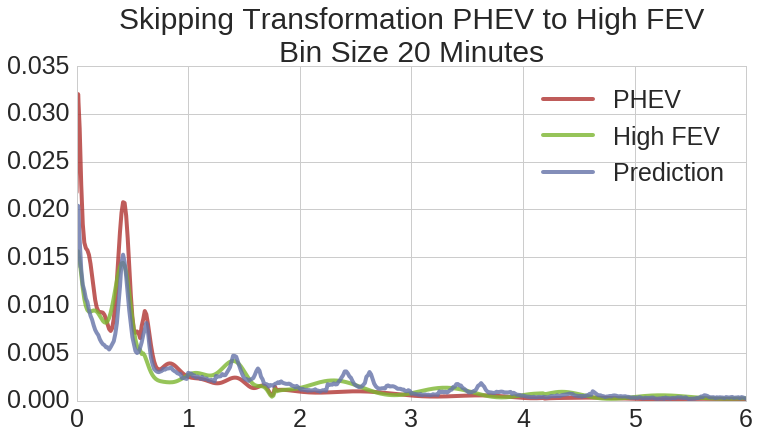

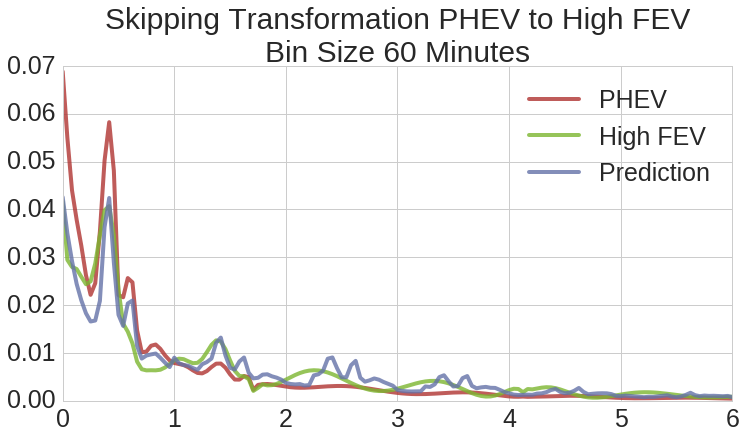

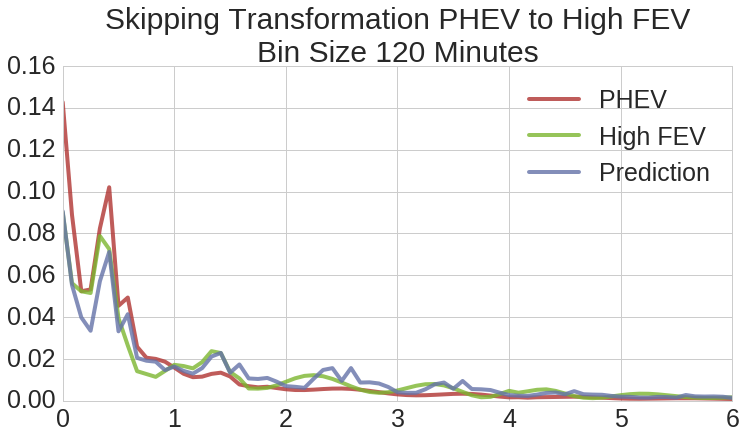

In [482]:
print('Bin size 20 minutes:')
battery_size_functions.print_errors(disconnection_distribution_high_fev_20, disconnection_distribution_phev_20,
                                   ['high fev', 'phev'], max_size = max_dc_20)
battery_size_functions.print_errors(disconnection_distribution_high_fev_20, skipping_results_20,
                                   ['high fev', 'pred'], max_size = max_dc_20)
battery_size_functions.print_errors(disconnection_distribution_phev_20, skipping_results_20,
                                   ['phev', 'pred'], max_size = max_dc_20)

print('\nBin size 60 minutes:')
battery_size_functions.print_errors(disconnection_distribution_high_fev_60, disconnection_distribution_phev_60,
                                   ['high fev', 'phev'], max_size = max_dc_60)
battery_size_functions.print_errors(disconnection_distribution_high_fev_60, skipping_results_60,
                                   ['high fev', 'pred'], max_size = max_dc_60)
battery_size_functions.print_errors(disconnection_distribution_phev_60, skipping_results_60,
                                   ['phev', 'pred'], max_size = max_dc_60)

print('\nBin size 120 minutes:')
battery_size_functions.print_errors(disconnection_distribution_high_fev_120, disconnection_distribution_phev_120,
                                   ['high fev', 'phev'], max_size = max_dc_120)
battery_size_functions.print_errors(disconnection_distribution_high_fev_120, skipping_results_120,
                                   ['high fev', 'pred'], max_size = max_dc_120)
battery_size_functions.print_errors(disconnection_distribution_phev_120, skipping_results_120,
                                   ['phev', 'pred'], max_size = max_dc_120)

plot_skipping_results(20, disconnection_distribution_phev_20, disconnection_distribution_high_fev_20, max_dc_20,
                     skipping_results_20)
plot_skipping_results(60, disconnection_distribution_phev_60, disconnection_distribution_high_fev_60, max_dc_60,
                     skipping_results_60)
plot_skipping_results(120, disconnection_distribution_phev_120, disconnection_distribution_high_fev_120, max_dc_120,
                     skipping_results_120)

## Appendix skip reasons

In [569]:


def plot_behavior_week_sessions_disconnect(df, title = " "):
    seaborn.set(style='whitegrid', font_scale=1.9)
    fig = plt.figure(figsize=(12, 6))
    ax = seaborn.pointplot(x="weekday", y="disconnection_duration_days", 
                           order = ["Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday"], 
                            data = df, capsize=.2, linestyles = '--', scale = 1.5, fliersize = 0) #hue = "kwh_grouped",
    plt.title(title,  fontsize = 30)
    plt.xlabel(" ")
    plt.ylabel("Disconnection duration (days)")

def plot_behavior_week_sessions_connect(df, title = " "):
    seaborn.set(style='whitegrid', font_scale=1.9)
    fig = plt.figure(figsize=(12, 6))
    ax = seaborn.pointplot(x="weekday", y="connection_duration_days", 
                           order = ["Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday"], 
                            data = df, capsize=.2, linestyles = '--', scale = 1.5, fliersize = 0) #hue = "kwh_grouped",
    plt.title(title,  fontsize = 30)
    plt.xlabel(" ")
    plt.ylabel("Connection duration (days)")

def plot_behavior_week_sessions_connect_all(df, title = " ", 
        save = False, fig_name = " ", save_dir = 'data/experiment_figures/battery_size/'):
    seaborn.set(style='whitegrid', font_scale=1.9)
    pal = seaborn.color_palette([my_colors['phev'], my_colors['low'], my_colors['high']])
    fig = plt.figure(figsize=(12, 6))
    ax = seaborn.pointplot(x="weekday", y="connection_duration_days", 
                           order = ["Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday"], 
                           hue = "car_type", data = df, capsize=.2, linestyles = '--', scale = 1.5, fliersize = 0, 
                           palette = pal)
    plt.title(title,  fontsize = 30)
    plt.xlabel(" ")
    plt.ylabel("Connection Duration (days)")
    ax.legend(title = "", loc = 'best')
    
    if save:
        if fig_name == " ":
            print("specify fig_name")
            plt.show()
        else:
            plt.savefig(save_dir + '%s.png' % (fig_name),bbox_inches='tight')
            plt.close(fig)
    else:
        plt.show()
    
    
    
def plot_behavior_week_sessions_disconnect_all(df, title = " ",
        save = False, fig_name = " ", save_dir = 'data/experiment_figures/battery_size/'):
    pal = seaborn.color_palette([my_colors['phev'], my_colors['low'], my_colors['high']])
    fig = plt.figure(figsize=(12, 6))
    seaborn.set(style="whitegrid", font_scale=1.9)
    ax = seaborn.pointplot(x="weekday", y="disconnection_duration_days", 
                           order = ["Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday"], 
                           hue = "car_type", data = df, capsize=.2, linestyles = '--', scale = 1.5, fliersize = 0,
                           palette = pal)
    seaborn.despine(left=True)


    plt.title(title,  fontsize = 30)
    plt.xlabel(" ")
    plt.ylabel("Disconnection Duration (days)")
    ax.legend(title = "", loc = 'best')
    
    if save:
        if fig_name == " ":
            print("specify fig_name")
            plt.show()
        else:
            plt.savefig(save_dir + '%s.png' % (fig_name),bbox_inches='tight')
            plt.close(fig)
    else:
        plt.show()

def plot_behavior_week_skip_session(df, xdata, ydata, title = " ", xlabel = " ",
    save = False, fig_name = " ", save_dir = 'data/experiment_figures/battery_size/'):
    
#     pal = seaborn.color_palette([phev_dark_color, fev_low_dark_color, fev_high_dark_color])
    my_colors = {'main': '#6472A8', 'main_light': '#A3ACCD', 'main_dark': '#2F4085', 'main_light_light': '#E8EBF4',
            'low': '#B08C31', 'low_light': '#CEB779',
            'phev': '#B03331', 'phev_light': '#CD7C7A',
            'high': '#7CB630', 'high_light': '#AED27A'}


    pal = seaborn.color_palette([my_colors['phev'], my_colors['low'], my_colors['high']])
    fig = plt.figure(figsize=(12, 6))
    seaborn.set(style="whitegrid", font_scale=1.9)
    ax = seaborn.pointplot(x=xdata, y=ydata, 
#                            order = ["Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday"], 
                           hue = "car_type", data = df, capsize=.2, linestyles = '--', scale = 1.5, fliersize = 0,
                           palette = pal,
                          markers='o')
    seaborn.despine(left=True)


    plt.title(title,  fontsize = 30)
    plt.xlabel(xlabel)
    plt.ylabel("Fraction")
    ax.legend(title = "", loc = 'best')
    
    if save:
        if fig_name == " ":
            print("specify fig_name")
            plt.show()
        else:
            plt.savefig(save_dir + '%s.png' % (fig_name),bbox_inches='tight')
            plt.close(fig)
    else:
        plt.show()
        
def create_df_skip_vs_day(df):
    days = ["Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday"]
    data = {}
    weekdays = []
    cartypes = []
    p_skip_day = []
    p_skip_2days = []
    for i, a in enumerate(data_agents):
        if a not in df or data_agents[a]['battery_category'] == 'unknown':
            continue
        car_type = data_agents[a]['battery_category']
        for day in days:
            sessions = df[a].loc[df[a]['weekday'] == day]
            nr_sessions = len(sessions)
            if nr_sessions == 0 :
                continue
            nr_dc_over_day = len(sessions.loc[sessions['disconnection_duration_days'] > 1.0])
            nr_dc_over_2days = len(sessions.loc[sessions['disconnection_duration_days'] > 2.0])
            weekdays.append(day)
            cartypes.append(car_type)
            p_skip_day.append(nr_dc_over_day / nr_sessions)
            p_skip_2days.append(nr_dc_over_2days / nr_sessions)
    data['weekday'] = weekdays
    data['car_type'] = cartypes
    data['p_skip_day'] = p_skip_day
    data['p_skip_2days'] = p_skip_2days
    return pandas.DataFrame.from_dict(data)

def create_df_skip_vs_soc(df):
    data = {}
    soc = []
    car_types = []
    p_skip_day = []
    p_skip_2days = []
    for i, a in enumerate(data_agents):
#         if i == 10:
#             break
        if a not in df or data_agents[a]['battery_category'] == 'unknown':
            continue
        sessions = df[a]
        battery_size = data_agents[a]['battery_size']
        car_type = data_agents[a]['battery_category']
        sessions['soc'] = sessions.apply(lambda row: max(0, 1 - row.kWh / battery_size), axis = 1)
#         print(battery_size)
#         print(sessions[['kWh', 'soc']])
#         break
        for soc_range in numpy.arange(0, 1, 0.1):
            soc_sessions = sessions.loc[sessions['soc'] < soc_range]
            if len(soc_sessions) == 0:
                continue
            nr_dc_over_day = len(soc_sessions.loc[soc_sessions['disconnection_duration_days'] > 1.0])
            nr_dc_over_2days = len(soc_sessions.loc[soc_sessions['disconnection_duration_days'] > 2.0])
            sessions = sessions.loc[sessions['soc'] >= soc_range]
            car_types.append(car_type)
            p_skip_day.append(nr_dc_over_day / len(soc_sessions))
            p_skip_2days.append(nr_dc_over_2days / len(soc_sessions))
            soc.append(soc_range)
    data['soc'] = soc
    data['car_type'] = car_types
    data['p_skip_day'] = p_skip_day
    data['p_skip_2days'] = p_skip_2days
    return pandas.DataFrame.from_dict(data)
            


In [416]:
dfs_phev = []
dfs_low_fev = []
dfs_high_fev = []

for i, a in enumerate(sessions_data_expanded):
    if a not in data_agents:
        continue
    if data_agents[a]['battery_category'] == 'phev':
        dfs_phev.append(sessions_data_expanded[a])
    elif data_agents[a]['battery_category'] == 'fev_low':
        dfs_low_fev.append(sessions_data_expanded[a])
    elif data_agents[a]['battery_category'] == 'fev_high':
        dfs_high_fev.append(sessions_data_expanded[a])


phev_sessions = pandas.concat(dfs_phev)
low_fev_sessions = pandas.concat(dfs_low_fev)
high_fev_sessions = pandas.concat(dfs_high_fev)
phev_sessions['car_type']  = ['phev'] * len(phev_sessions)
low_fev_sessions['car_type']  = ['low_fev'] * len(low_fev_sessions)
high_fev_sessions['car_type']  = ['high_fev'] * len(high_fev_sessions)

all_sessions = pandas.concat([phev_sessions, low_fev_sessions, high_fev_sessions])
all_sessions_7 = all_sessions.loc[all_sessions.disconnection_duration < pandas.to_timedelta('7days')]
% time sessions_agents_7 = battery_size_functions.load_agent_sessions('data/agent_database/all_non_changing_agents_bin20/', data = all_sessions_7)

Loaded sessions for 0 of 2287 agents
Loaded sessions for 200 of 2287 agents
Loaded sessions for 400 of 2287 agents
Loaded sessions for 600 of 2287 agents
Loaded sessions for 800 of 2287 agents
Loaded sessions for 1000 of 2287 agents
Loaded sessions for 1200 of 2287 agents
Loaded sessions for 1400 of 2287 agents
Loaded sessions for 1600 of 2287 agents
Loaded sessions for 1800 of 2287 agents
Loaded sessions for 2000 of 2287 agents
Loaded sessions for 2200 of 2287 agents
CPU times: user 44.1 s, sys: 32 ms, total: 44.1 s
Wall time: 44.1 s


In [437]:
mapping = {'phev': 'PHEV', 'low_fev': 'Low FEV', 'high_fev': 'High FEV', 
          'PHEV': 'PHEV'}
%time all_sessions['car_type'] = all_sessions['car_type'].map(lambda val:mapping[val] )


CPU times: user 144 ms, sys: 4 ms, total: 148 ms
Wall time: 147 ms


In [532]:
% time sessions_agents_all = battery_size_functions.load_agent_sessions('data/agent_database/all_non_changing_agents_bin20/', data = all_sessions)
%time overall_df_all = create_df_skip_vs_day(sessions_agents_all)

Loaded sessions for 0 of 2287 agents
Loaded sessions for 200 of 2287 agents
Loaded sessions for 400 of 2287 agents
Loaded sessions for 600 of 2287 agents
Loaded sessions for 800 of 2287 agents
Loaded sessions for 1000 of 2287 agents
Loaded sessions for 1200 of 2287 agents
Loaded sessions for 1400 of 2287 agents
Loaded sessions for 1600 of 2287 agents
Loaded sessions for 1800 of 2287 agents
Loaded sessions for 2000 of 2287 agents
Loaded sessions for 2200 of 2287 agents
CPU times: user 45.2 s, sys: 52 ms, total: 45.3 s
Wall time: 45.3 s
CPU times: user 24 s, sys: 40 ms, total: 24 s
Wall time: 24 s


In [540]:
mapping = {'phev': 'PHEV', 'low_fev': 'Low FEV', 'high_fev': 'High FEV', 
          'PHEV': 'PHEV', 'fev_high': 'High FEV', 'fev_low': 'Low FEV'}
overall_df_all['car_type'] = overall_df_all['car_type'].map(lambda val:mapping[val] )

In [533]:
all_sessions_3 = all_sessions.loc[all_sessions.disconnection_duration < pandas.to_timedelta('3days')]
% time sessions_agents_3 = battery_size_functions.load_agent_sessions('data/agent_database/all_non_changing_agents_bin20/', data = all_sessions_3)
%time overall_df_3 = create_df_skip_vs_day(sessions_agents_3)

Loaded sessions for 0 of 2287 agents
Loaded sessions for 200 of 2287 agents
Loaded sessions for 400 of 2287 agents
Loaded sessions for 600 of 2287 agents
Loaded sessions for 800 of 2287 agents
Loaded sessions for 1000 of 2287 agents
Loaded sessions for 1200 of 2287 agents
Loaded sessions for 1400 of 2287 agents
Loaded sessions for 1600 of 2287 agents
Loaded sessions for 1800 of 2287 agents
Loaded sessions for 2000 of 2287 agents
Loaded sessions for 2200 of 2287 agents
CPU times: user 40.5 s, sys: 16 ms, total: 40.6 s
Wall time: 40.6 s
CPU times: user 23.5 s, sys: 48 ms, total: 23.6 s
Wall time: 23.6 s


In [541]:
mapping = {'phev': 'PHEV', 'low_fev': 'Low FEV', 'high_fev': 'High FEV', 
          'PHEV': 'PHEV', 'fev_high': 'High FEV', 'fev_low': 'Low FEV'}
overall_df_3['car_type'] = overall_df_3['car_type'].map(lambda val:mapping[val] )

In [564]:
% time df_skip_vs_soc_7 = create_df_skip_vs_soc(sessions_agents_7)

CPU times: user 1min 27s, sys: 0 ns, total: 1min 27s
Wall time: 1min 28s


In [565]:
mapping = {'phev': 'PHEV', 'low_fev': 'Low FEV', 'high_fev': 'High FEV', 
          'PHEV': 'PHEV', 'fev_high': 'High FEV', 'fev_low': 'Low FEV'}
df_skip_vs_soc_7['car_type'] = df_skip_vs_soc_7['car_type'].map(lambda val:mapping[val] )

In [583]:
new_sessions = all_sessions.loc[all_sessions['disconnection_duration_days'] >= 1.0]
new_sessions = new_sessions.loc[new_sessions['disconnection_duration_days'] <= 3.0]
# plot_behavior_week_sessions_connect_all(new_sessions, 
#     save = False, fig_name = "connection_duration_weekdays_morethan1_lessthan3_days",
#     title = "Transactions After 1 to 3 Days of Disconnection")
plot_behavior_week_sessions_disconnect_all(new_sessions, 
    save = True, fig_name = "disconnection_duration_weekdays_>1_<3_days",
    title = "Disconnection Durations per Weekday\nDisconnections of >1 and <3 Days")

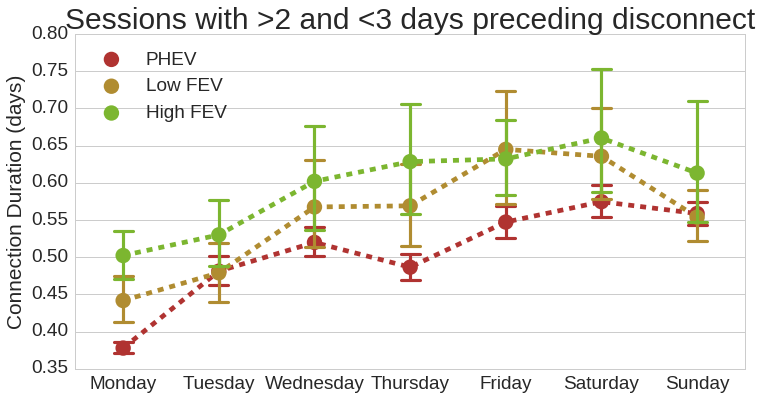

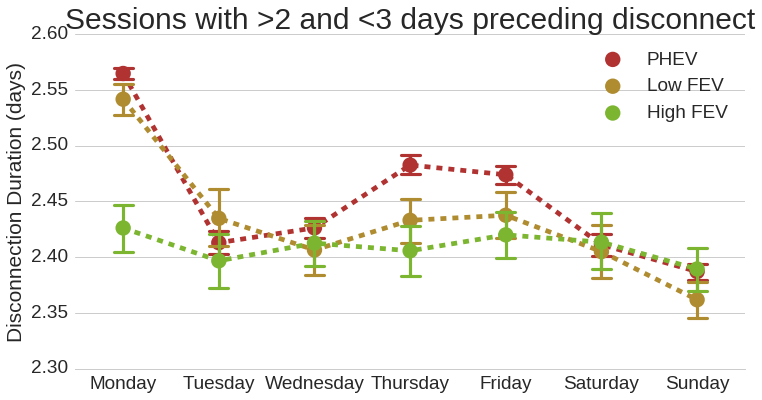

In [554]:
new_sessions = all_sessions.loc[all_sessions['disconnection_duration_days'] >= 2.0]
new_sessions = new_sessions.loc[new_sessions['disconnection_duration_days'] <= 3.0]
plot_behavior_week_sessions_connect_all(new_sessions, 
                                        save = False, fig_name = "connection_duration_weekdays_>2_<3_days",
                                       title = "Sessions with >2 and <3 days preceding disconnect")
plot_behavior_week_sessions_disconnect_all(new_sessions, 
                                           save = False, fig_name = "disconnection_duration_weekdays_>2_<3days",
                                          title = "Sessions with >2 and <3 days preceding disconnect")

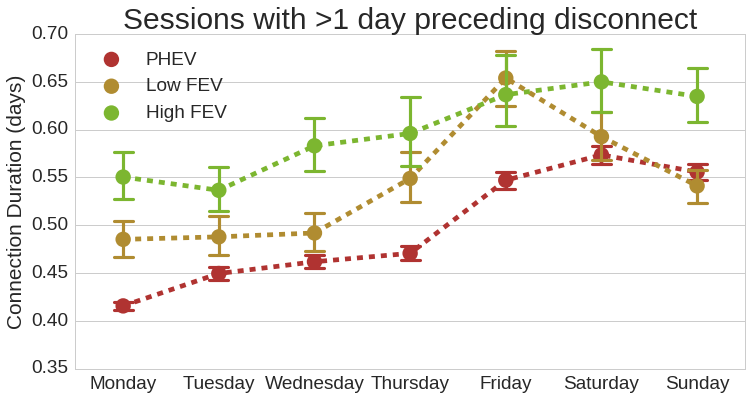

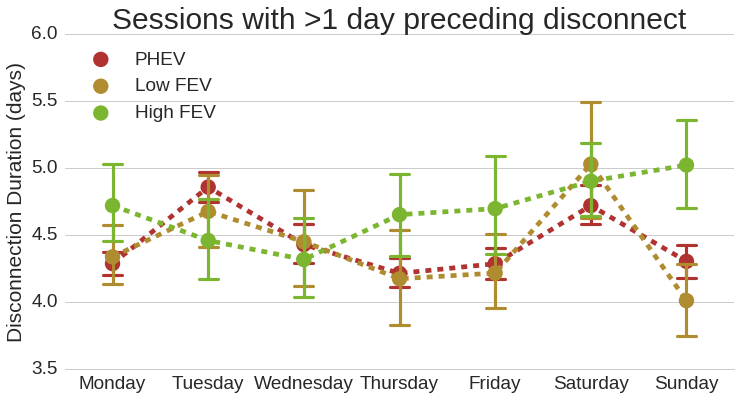

In [555]:
plot_behavior_week_sessions_connect_all(all_sessions.loc[all_sessions['disconnection_duration_days'] >= 1.0], 
                                        save = False, fig_name = "connection_duration_weekdays_>1day",
                                       title = "Sessions with >1 day preceding disconnect")
plot_behavior_week_sessions_disconnect_all(all_sessions.loc[all_sessions['disconnection_duration_days'] >= 1.0], 
                                           save = False, fig_name = "disconnection_duration_weekdays_>1day",
                                          title = "Sessions with >1 day preceding disconnect")

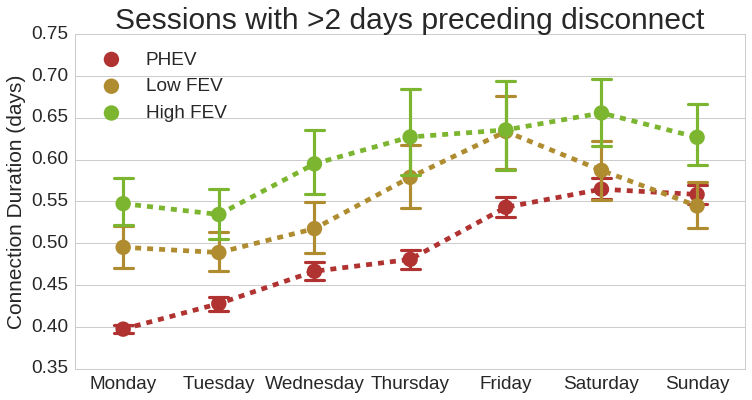

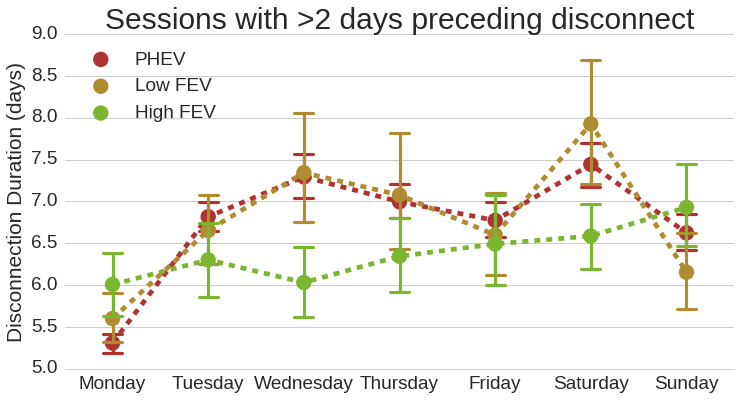

In [556]:
plot_behavior_week_sessions_connect_all(all_sessions.loc[all_sessions['disconnection_duration_days'] >= 2.0], 
                                        save = False, fig_name = "connection_duration_weekdays_>2day",
                                       title = "Sessions with >2 days preceding disconnect")
plot_behavior_week_sessions_disconnect_all(all_sessions.loc[all_sessions['disconnection_duration_days'] >= 2.0], 
                                           save = False, fig_name = "disconnection_duration_weekdays_>2day",
                                          title = "Sessions with >2 days preceding disconnect")

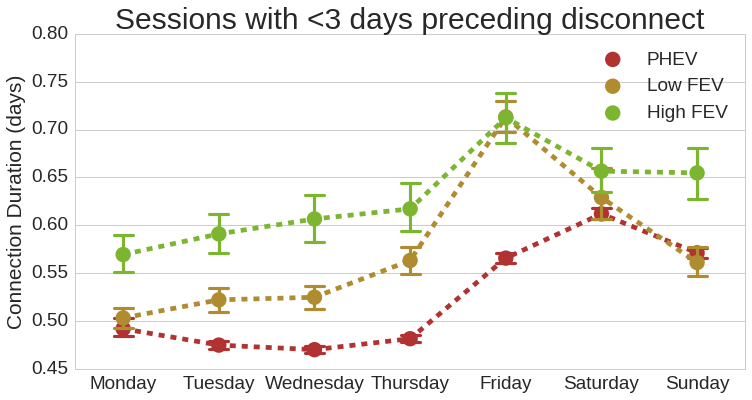

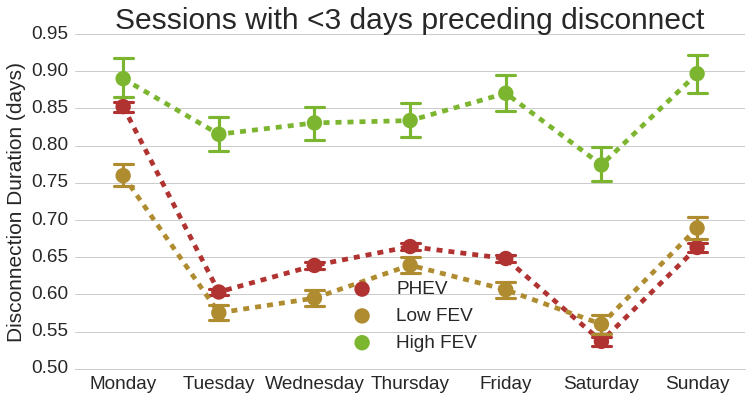

In [557]:
plot_behavior_week_sessions_connect_all(all_sessions.loc[all_sessions['disconnection_duration_days'] <= 3.0], 
                                        save = False, fig_name = "connection_duration_weekdays_<3days",
                                        title = "Sessions with <3 days preceding disconnect")
plot_behavior_week_sessions_disconnect_all(all_sessions.loc[all_sessions['disconnection_duration_days'] <= 3.0], 
                                           save = False, fig_name = "disconnection_duration_weekdays_<3days",
                                          title = "Sessions with <3 days preceding disconnect")

In [582]:
# plot_behavior_week_sessions_connect_all(all_sessions.loc[all_sessions['disconnection_duration_days'] <= 7.0], 
#                                         save = False, fig_name = "connection_duration_weekdays_lessthan7days",
#                                         title = "Connection Durations per Weekday\nFiltered Disconnections > 7 Days")
plot_behavior_week_sessions_disconnect_all(all_sessions.loc[all_sessions['disconnection_duration_days'] <= 7.0], 
                                           save = True, fig_name = "disconnection_duration_weekdays_lessthan7days",
                                          title = "Disconnection Durations per Weekday\nDisconnections of < 7 Days")

In [580]:
plot_behavior_week_sessions_connect_all(all_sessions, save = True, fig_name = "connection_duration_weekdays",
                                       title = 'Connection Durations per Weekday')
plot_behavior_week_sessions_disconnect_all(all_sessions, save = True, fig_name = "disconnection_duration_weekdays",
                                          title = 'Disconnection Durations per Weekday')

In [578]:
plot_behavior_week_skip_session(overall_df_all, 'weekday', 'p_skip_day', title = "Probability of Having Skipped More Than One Day",
                               save = True, fig_name = 'p_skip_day_weekdays_all')
plot_behavior_week_skip_session(overall_df_all, 'weekday', 'p_skip_2days', title = "Probability of Having Skipped More Than Two Days",
                               save = True, fig_name = 'p_skip_2days_weekdays_all')

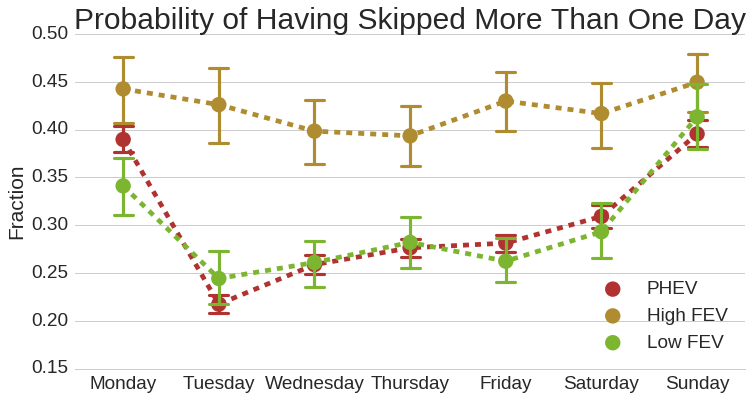

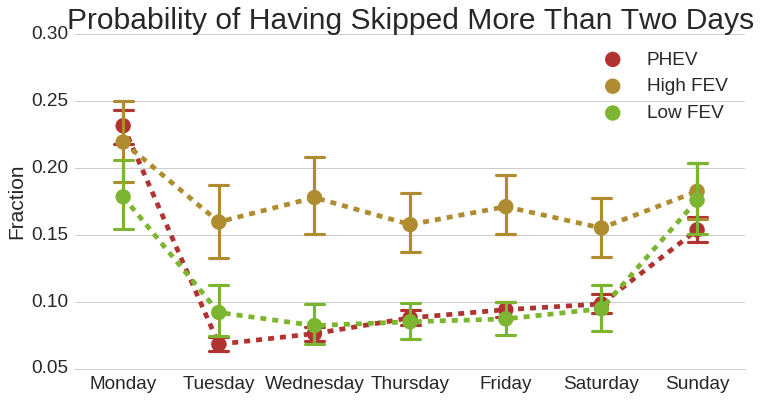

In [562]:
plot_behavior_week_skip_session(overall_df_3, 'weekday', 'p_skip_day', title = "Probability of Having Skipped More Than One Day",
                               save = False, fig_name = 'p_skip_day_weekdays_3')
plot_behavior_week_skip_session(overall_df_3, 'weekday', 'p_skip_2days', title = "Probability of Having Skipped More Than Two Days",
                               save = False, fig_name = 'p_skip_2days_weekdays_3')

In [577]:
plot_behavior_week_skip_session(df_skip_vs_soc_7, 'soc', 'p_skip_day', title = "Probability of Having Skipped More Than One Day",
                               xlabel = "SOC", save = True, fig_name = 'p_skip_day_soc')
plot_behavior_week_skip_session(df_skip_vs_soc_7, 'soc', 'p_skip_2days', title = "Probability of Having Skipped More Than Two Days",
                                xlabel = "SOC", save = True, fig_name = 'p_skip_2days_soc')

In [344]:
def get_colors(colors):
    
    my_colors = {'main': '#6472A8', 'main_light': '#A3ACCD', 'main_dark': '#2F4085', 'main_light_light': '#E8EBF4',
            'low': '#B08C31', 'low_light': '#CEB779',
            'phev': '#B03331', 'phev_light': '#CD7C7A',
            'high': '#7CB630', 'high_light': '#AED27A'}


    new_colors = []
    for c in colors:
        if c in my_colors:
            new_colors.append(my_colors[c])
        else:
            print('Unknown color %s' %c)
            new_colors.append(None)
    return new_colors

def simple_plot_mult_dist(xvals, yvals, yvals_labels, title = " ", xlabel = '', ylabel = '',
    xmin = 0, xmax = -1, ymin = None, linewidth = 4, colors = None, alpha = None, xticks = None,
                         fig_size = [12, 6]):

    for yval in yvals:
        if len(yval) != len(xvals):
            print('length xvals (%d) and each yvals (%s) should be the same' %(len(xvals), [len(yval) for yval in yvals]))
            return
    seaborn.set(style='whitegrid', font_scale=2.5)
    fig = plt.figure(figsize=(fig_size[0], fig_size[1]))
    labels = []

    if colors == None:
        colors = [None]*len(yvals)
    elif len(colors) != len(yvals):
        print('ERROR: In simple_plot_mult_dist length colors (%d) should be the same as length yvals (%s).' %
            (len(colors), len(yvals)))
        return
    else:
        colors = get_colors(colors)

    if not isinstance(linewidth, list):
        linewidth = [linewidth]*len(yvals)
    elif len(linewidth) != len(yvals):
        print('ERROR: In simple_plot_mult_dist length linewidth (%d) should be the same as length yvals (%d)' %
            (len(linewidth), len(yvals)))
        return

    if alpha == None:
        alpha = [None]*len(yvals)
    elif not isinstance(alpha, list):
        alpha = [alpha] * len(yvals)
    elif len(alpha) != len(yvals):
        print('ERROR: In simple_plot_mult_dist length of alpha (%s) should be the same as length yvals (%s) [or provide a float]' %
            (len(alpha), len(yvals)))

    for i, yval in enumerate(yvals):
        lab, = plt.plot(xvals, yval, label = yvals_labels[i], linewidth = linewidth[i], color = colors[i], 
                        alpha = alpha[i])
        labels.append(lab)
    plt.legend(handles=labels, loc = 'best')
    plt.title(title, fontsize = 30)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    if xticks != None:
        plt.xticks(range(24), xticks, rotation = 90)
    if xmax > 0:
        plt.xlim(xmin, xmax)
    if ymin != None:
        plt.ylim(ymin,)
    plt.show()